# Define Input Folder and Files

In [1]:
import os

# Define the folder path
input_folder = "Input_Folder_without_Nan"

# Get the list of CSV file names in the folder
input_files = [file for file in os.listdir(input_folder) if file.endswith('.csv')]

# Print the results
print("Input Folder:", input_folder)
print(f"Input Files: {len(input_files)}")
print(input_files)


Input Folder: Input_Folder_without_Nan
Input Files: 41
['UP002.csv', 'UP003.csv', 'UP004.csv', 'UP008.csv', 'UP009.csv', 'UP012.csv', 'UP014.csv', 'UP016.csv', 'UP017.csv', 'UP018.csv', 'UP019.csv', 'UP020.csv', 'UP021.csv', 'UP022.csv', 'UP023.csv', 'UP024.csv', 'UP025.csv', 'UP026.csv', 'UP028.csv', 'UP029.csv', 'UP030.csv', 'UP031.csv', 'UP032.csv', 'UP033.csv', 'UP034.csv', 'UP035.csv', 'UP036.csv', 'UP037.csv', 'UP038.csv', 'UP039.csv', 'UP040.csv', 'UP041.csv', 'UP042.csv', 'UP043.csv', 'UP044.csv', 'UP046.csv', 'UP048.csv', 'UP049.csv', 'UP050.csv', 'UP051.csv', 'UP052.csv']


In [2]:
import pandas as pd

dataframes_dictionary = {}  # Dictionary to store DataFrames
print(input_folder)
for file in input_files:
    file_path = os.path.join(input_folder, file)
    if os.path.exists(file_path):
        # Load the CSV file
        df = pd.read_csv(file_path)
        dataframes_dictionary[file] = df


Input_Folder_without_Nan


# Add Additional columns to the dataframes

In [3]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data

from sklearn.preprocessing import LabelEncoder

# Initialize a label encoder
label_encoder = LabelEncoder()

# Load and process the data
dataframes = []
for file_name in input_files:
    df = dataframes_dictionary[file_name]
    
    # Convert 'From Date' to pandas datetime
    df['From Date'] = pd.to_datetime(df['From Date'])
    
    # Split 'From Date' into Year, Month, Day, Hour
    df['Year'] = df['From Date'].dt.year
    df['Month'] = df['From Date'].dt.month
    df['Day'] = df['From Date'].dt.day
    df['Hour'] = df['From Date'].dt.hour
    
    # Drop the original 'From Date' column
    df.drop('From Date', axis=1, inplace=True)
    
    dataframes.append(df)


# Split the data into training and test sets

In [4]:
train_dataframes = []
test_dataframes = []

split_ratio = 0.85  # 85% train, 15% test
train_size = int(len(dataframes[0]) * split_ratio)

for node_idx, df in enumerate(dataframes):
    # Split the dataframe into train and test sets

    train_df = df.iloc[:train_size]
    test_df = df.iloc[train_size:]
    
    # Append the train and test dataframes to the respective lists
    train_dataframes.append(train_df)
    test_dataframes.append(test_df)

print(f"Train dataframes shape: {train_dataframes[0].shape}")
print(f"Test dataframes shape: {test_dataframes[0].shape}")    

Train dataframes shape: (8343, 15)
Test dataframes shape: (1473, 15)


# Scale the Data

In [7]:
from sklearn.preprocessing import StandardScaler

scalers = {}

feature_scalers = {}

print(train_dataframes[0].dtypes)

# Apply StandardScaler to all numeric columns except 'Year', 'Month', 'Day', 'Hour'
for node_idx, df in enumerate(train_dataframes):

    print(f"Training Processing {input_files[node_idx]}, node index: {node_idx}")
    # Encode the 'Year' column
    df['Year'] = label_encoder.fit_transform(df['Year'])

    numeric_columns = df.select_dtypes(include=[np.number]).columns.tolist()
    columns_to_scale = [col for col in numeric_columns if col not in ['Year', 'Month', 'Day', 'Hour', 'AT (degree C)']]
    
    scaler = StandardScaler()
    df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])
    feature_scalers[input_files[node_idx]] = scaler

    scaler1 = StandardScaler()
    df['AT (degree C)'] = scaler1.fit_transform(df[['AT (degree C)']])
    
    # Save the scaler for the target column
    scalers[input_files[node_idx]] = scaler1


print(test_dataframes[0].dtypes)    

# Apply the same scaling to the test dataframes
for node_idx, df in enumerate(test_dataframes):

    print(f"Testing Processing {input_files[node_idx]}, node index: {node_idx}, shape: {df.shape}")
    # Encode the 'Year' column
    df['Year'] = label_encoder.fit_transform(df['Year'])

    numeric_columns = df.select_dtypes(include=[np.number]).columns.tolist()
    columns_to_scale = [col for col in numeric_columns if col not in ['Year', 'Month', 'Day', 'Hour', 'AT (degree C)']]
    
    scaler = feature_scalers[input_files[node_idx]]
    df[columns_to_scale] = scaler.transform(df[columns_to_scale])
    
    scaler1 = scalers[input_files[node_idx]]
    df['AT (degree C)'] = scaler1.transform(df[['AT (degree C)']])
 

PM2.5 (ug/m3)    float64
PM10 (ug/m3)     float64
NO (ug/m3)       float64
NO2 (ug/m3)      float64
SO2 (ug/m3)      float64
CO (mg/m3)       float64
Ozone (ug/m3)    float64
RH (%)           float64
WS (m/s)         float64
WD (degree)      float64
AT (degree C)    float64
Year               int32
Month              int32
Day                int32
Hour               int32
dtype: object
Training Processing UP002.csv, node index: 0
Training Processing UP003.csv, node index: 1
Training Processing UP004.csv, node index: 2
Training Processing UP008.csv, node index: 3
Training Processing UP009.csv, node index: 4
Training Processing UP012.csv, node index: 5
Training Processing UP014.csv, node index: 6
Training Processing UP016.csv, node index: 7
Training Processing UP017.csv, node index: 8


C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = label_encoder.fit_transform(df['Year'])
C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])
C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usin

Training Processing UP018.csv, node index: 9
Training Processing UP019.csv, node index: 10
Training Processing UP020.csv, node index: 11
Training Processing UP021.csv, node index: 12
Training Processing UP022.csv, node index: 13
Training Processing UP023.csv, node index: 14
Training Processing UP024.csv, node index: 15
Training Processing UP025.csv, node index: 16
Training Processing UP026.csv, node index: 17
Training Processing UP028.csv, node index: 18


C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])
C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['AT (degree C)'] = scaler1.fit_transform(df[['AT (degree C)']])
C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

Training Processing UP029.csv, node index: 19
Training Processing UP030.csv, node index: 20
Training Processing UP031.csv, node index: 21
Training Processing UP032.csv, node index: 22
Training Processing UP033.csv, node index: 23
Training Processing UP034.csv, node index: 24
Training Processing UP035.csv, node index: 25
Training Processing UP036.csv, node index: 26
Training Processing UP037.csv, node index: 27
Training Processing UP038.csv, node index: 28
Training Processing UP039.csv, node index: 29
Training Processing UP040.csv, node index: 30
Training Processing UP041.csv, node index: 31


C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['AT (degree C)'] = scaler1.fit_transform(df[['AT (degree C)']])
C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = label_encoder.fit_transform(df['Year'])
C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usi

Training Processing UP042.csv, node index: 32
Training Processing UP043.csv, node index: 33
Training Processing UP044.csv, node index: 34
Training Processing UP046.csv, node index: 35
Training Processing UP048.csv, node index: 36
Training Processing UP049.csv, node index: 37
Training Processing UP050.csv, node index: 38
Training Processing UP051.csv, node index: 39
Training Processing UP052.csv, node index: 40
PM2.5 (ug/m3)    float64
PM10 (ug/m3)     float64
NO (ug/m3)       float64
NO2 (ug/m3)      float64
SO2 (ug/m3)      float64
CO (mg/m3)       float64
Ozone (ug/m3)    float64
RH (%)           float64
WS (m/s)         float64
WD (degree)      float64
AT (degree C)    float64
Year               int32
Month              int32
Day                int32
Hour               int32
dtype: object
Testing Processing UP002.csv, node index: 0, shape: (1473, 15)
Testing Processing UP003.csv, node index: 1, shape: (1473, 15)
Testing Processing UP004.csv, node index: 2, shape: (1473, 15)
Testing 

C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = label_encoder.fit_transform(df['Year'])
C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])
C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usin

Testing Processing UP016.csv, node index: 7, shape: (1473, 15)
Testing Processing UP017.csv, node index: 8, shape: (1473, 15)
Testing Processing UP018.csv, node index: 9, shape: (1473, 15)
Testing Processing UP019.csv, node index: 10, shape: (1473, 15)
Testing Processing UP020.csv, node index: 11, shape: (1473, 15)
Testing Processing UP021.csv, node index: 12, shape: (1473, 15)
Testing Processing UP022.csv, node index: 13, shape: (1473, 15)
Testing Processing UP023.csv, node index: 14, shape: (1473, 15)
Testing Processing UP024.csv, node index: 15, shape: (1473, 15)
Testing Processing UP025.csv, node index: 16, shape: (1473, 15)
Testing Processing UP026.csv, node index: 17, shape: (1473, 15)
Testing Processing UP028.csv, node index: 18, shape: (1473, 15)
Testing Processing UP029.csv, node index: 19, shape: (1473, 15)
Testing Processing UP030.csv, node index: 20, shape: (1473, 15)
Testing Processing UP031.csv, node index: 21, shape: (1473, 15)
Testing Processing UP032.csv, node index: 2

C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['AT (degree C)'] = scaler1.transform(df[['AT (degree C)']])
C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = label_encoder.fit_transform(df['Year'])
C:\Users\Asus\AppData\Local\Temp\ipykernel_17336\2524091884.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

# Modifying the csv to add latitude and longitude

In [8]:
import pandas as pd

# Load the CSV file
file_path = 'final.csv'  # Replace with your file path
df = pd.read_csv(file_path, header=None)

# Define the new column names
new_columns = ['file_name', 'state', 'city', 'agency', 'station_location', 
               'start_month', 'start_month_num', 'start_year', 'latitude', 'longitude']

# Assign the new column names to the dataframe
df.columns = new_columns

# Save the modified dataframe back to CSV
modified_file_path = 'final_modified.csv'  # Specify the output file path
df.to_csv(modified_file_path, index=False)

print(f"Modified file saved as {modified_file_path}")

Modified file saved as final_modified.csv


# Checking if all files have latitudes and longitudes

In [9]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('final_modified.csv')

# Remove ".csv" extension from the files_with_at_column
files_without_extension = [file.replace('.csv', '') for file in input_files]

# Filter rows from the dataframe where the file_name is in the files_without_extension array
filtered_df = df[df['file_name'].isin(files_without_extension)]

# Extract latitude and longitude of the filtered rows
filtered_lat_long_positions = filtered_df[['latitude', 'longitude']].values.tolist()

# Find file names that do not have latitude and longitude information
missing_files = [file for file in files_without_extension if file not in filtered_df['file_name'].values]

# Print the results
print("Filtered latitude and longitude positions:", filtered_lat_long_positions)
print("Files without latitude and longitude information:", missing_files)


Filtered latitude and longitude positions: [[26.828687, 80.968257], [25.347671, 82.98085], [27.198724, 78.006069], [28.543866, 77.331016], [28.662102, 77.373283], [28.478246, 77.481831], [29.467858, 77.711593], [28.722131, 77.753682], [28.694105, 77.4549], [28.645805, 77.369211], [28.73341, 77.298604], [28.553622, 77.47128], [28.58997, 77.311681], [28.569039, 77.397499], [28.957922, 77.759078], [26.849806, 81.007399], [29.002044, 77.760152], [29.06265, 77.71476], [27.204282, 77.925518], [25.301191, 82.996499], [27.194169, 77.965192], [25.262166, 82.995247], [26.731409, 83.433118], [25.493404, 81.862706], [27.233706, 78.026988], [26.763279, 80.927821], [25.428788, 81.91389], [27.166823, 78.376626], [25.449042, 81.827394], [26.90648, 80.983889], [26.506816, 80.251968], [25.325445, 82.995173], [27.104555, 78.003352], [27.57421, 77.654082], [26.426674, 80.325968], [28.885193, 78.738921], [28.854246, 78.772174], [28.841239, 78.696695], [28.964466, 77.27869], [27.16446, 78.391286], [25.45357

# Calculating distances between the points

In [10]:
import math

# Function to calculate the Haversine distance between two points on the Earth
def haversine(lat1, lon1, lat2, lon2):
    # Radius of the Earth in kilometers
    R = 6371.0
    
    # Convert latitude and longitude from degrees to radians
    lat1_rad = math.radians(lat1)
    lon1_rad = math.radians(lon1)
    lat2_rad = math.radians(lat2)
    lon2_rad = math.radians(lon2)
    
    # Differences in coordinates
    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad
    
    # Haversine formula
    a = math.sin(dlat / 2)**2 + math.cos(lat1_rad) * math.cos(lat2_rad) * math.sin(dlon / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    
    # Distance in kilometers
    distance = R * c
    return distance

# Initialize a 2D array to store the distances
num_stations = len(filtered_lat_long_positions)
distance_matrix = [[0] * num_stations for _ in range(num_stations)]

# Iterate over the array to calculate distances between each pair of stations
for i in range(num_stations):
    for j in range(num_stations):
        lat1, lon1 = filtered_lat_long_positions[i]
        lat2, lon2 = filtered_lat_long_positions[j]
        
        # Check if any latitude or longitude is None
        if None in (lat1, lon1, lat2, lon2):
            distance_matrix[i][j] = -1
        else:
            # Calculate the distance using the Haversine formula
            distance_matrix[i][j] = haversine(lat1, lon1, lat2, lon2)

# Output the 2D distance array
for row in distance_matrix:
    print(row)

# Get the number of rows (length of the outer list)
rows = len(distance_matrix)

# Get the number of columns (length of the first inner list, assuming all rows have the same number of columns)
columns = len(distance_matrix[0]) if rows > 0 else 0

# Print the shape
print(f"Shape: ({rows}, {columns})")


[0.0, 259.831294268261, 296.3073062470489, 405.71967084165664, 408.2831201387903, 389.2780421976758, 433.6248093898384, 379.9022461663081, 403.1202784144766, 407.75269006951396, 418.5168023768209, 394.0985785077845, 409.75765217382735, 401.26086412872326, 394.3312597566813, 4.538336824596205, 397.16042095417515, 404.7358890189317, 304.28787362360157, 264.3631791522258, 300.25474049648807, 267.10222540161783, 244.91806957183363, 173.24469530741052, 294.77943248602156, 8.30691912317224, 182.0490886691721, 259.5051000084394, 175.75234561274783, 8.788059469298602, 79.66689357184394, 262.5205143903347, 295.4259311719268, 338.07059597527996, 77.93792481191839, 316.7232944225239, 311.9990131479505, 316.1633594061282, 433.3949665835895, 258.0326294852914, 281.95404023105255]
[259.831294268261, 0.0, 536.971001381933, 663.1333206367073, 666.5260268959933, 646.748508222628, 692.9632693541472, 639.2595346251944, 661.7347052324445, 665.8970511529196, 676.9228193417765, 652.0154437921375, 667.406227

# Plotting the points on the map

In [11]:
import folium

avg_lat = sum([pos[0] for pos in filtered_lat_long_positions]) / len(filtered_lat_long_positions)
avg_long = sum([pos[1] for pos in filtered_lat_long_positions]) / len(filtered_lat_long_positions)
my_map = folium.Map(location=[avg_lat, avg_long], zoom_start=5)
    
# Add markers for each position
for lat, long in filtered_lat_long_positions:
    folium.Marker(location=[lat, long]).add_to(my_map)
    
# Save the map to an HTML file
my_map.save("map.html")

# Display the map in the notebook
my_map


# Plotting the points in a plot

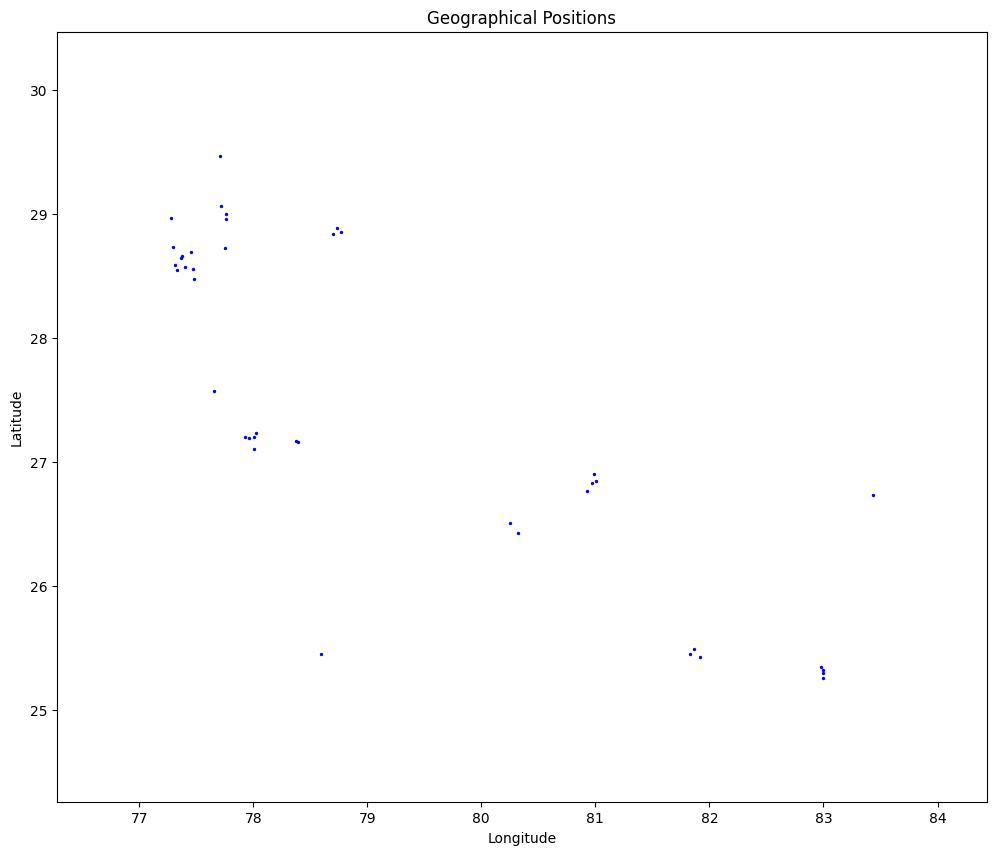

In [12]:
import matplotlib.pyplot as plt

# Split the latitude and longitude into separate lists
latitudes = [pos[0] for pos in filtered_lat_long_positions]
longitudes = [pos[1] for pos in filtered_lat_long_positions]

# Create a scatter plot with a larger figure size
plt.figure(figsize=(12, 10))  # Increase the figure size

# Plot the points with a larger marker size
plt.scatter(longitudes, latitudes, color='blue', marker='o', s=2)

# Label the axes
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Title of the plot
plt.title('Geographical Positions')

# Set the axis limits to zoom in and create more space between points
plt.xlim(min(longitudes) - 1, max(longitudes) + 1)
plt.ylim(min(latitudes) - 1, max(latitudes) + 1)

# Save the plot as an image file
output_image = 'positions_plot_large.png'
plt.savefig(output_image, dpi=300)  # Increase dpi for better resolution

# Show the plot
plt.show()


# Determine the k nearest neighbours

In [13]:
import numpy as np

k = 8  # Number of nearest neighbors

# Initialize adjacency matrix (with all zeros)
adjacency_matrix = np.zeros((len(input_files), len(input_files)), dtype=int)

# Loop through each entry to find k nearest neighbors
for i in range(len(input_files)):
    # Get distances for the i-th entry
    distances = distance_matrix[i]
    
    # Find the indices of the k smallest distances, excluding the distance to itself (i.e., index i)
    nearest_neighbors = np.argsort(distances)[1:k+1]  # 1:k+1 because argsort includes self-distance at position 0
    
    # Print the k nearest neighbors for the current file
    print(f"\nFile: {input_files[i]}")
    print(f"K-nearest neighbors: {[input_files[j] for j in nearest_neighbors]}")
    
    # Update the adjacency matrix to represent edges
    for neighbor in nearest_neighbors:
        adjacency_matrix[i][neighbor] = 1
        adjacency_matrix[neighbor][i] = 1  # Ensure undirected edge

# Print the adjacency matrix
print("\nAdjacency Matrix:")
print(adjacency_matrix)

# Print neighbors for each file based on the adjacency matrix
for i in range(len(input_files)):
    neighbors = [input_files[j] for j in range(len(input_files)) if adjacency_matrix[i][j] == 1]
    print(f"\nNeighbors of {input_files[i]} based on adjacency matrix: {neighbors}")


File: UP002.csv
K-nearest neighbors: ['UP024.csv', 'UP035.csv', 'UP039.csv', 'UP044.csv', 'UP040.csv', 'UP033.csv', 'UP038.csv', 'UP036.csv']

File: UP003.csv
K-nearest neighbors: ['UP041.csv', 'UP029.csv', 'UP031.csv', 'UP036.csv', 'UP033.csv', 'UP038.csv', 'UP032.csv', 'UP024.csv']

File: UP004.csv
K-nearest neighbors: ['UP030.csv', 'UP034.csv', 'UP028.csv', 'UP042.csv', 'UP037.csv', 'UP051.csv', 'UP043.csv', 'UP012.csv']

File: UP008.csv
K-nearest neighbors: ['UP021.csv', 'UP022.csv', 'UP018.csv', 'UP020.csv', 'UP009.csv', 'UP012.csv', 'UP017.csv', 'UP019.csv']

File: UP009.csv
K-nearest neighbors: ['UP018.csv', 'UP017.csv', 'UP021.csv', 'UP022.csv', 'UP019.csv', 'UP008.csv', 'UP020.csv', 'UP012.csv']

File: UP012.csv
K-nearest neighbors: ['UP020.csv', 'UP022.csv', 'UP008.csv', 'UP021.csv', 'UP018.csv', 'UP009.csv', 'UP017.csv', 'UP019.csv']

File: UP014.csv
K-nearest neighbors: ['UP026.csv', 'UP025.csv', 'UP023.csv', 'UP050.csv', 'UP016.csv', 'UP017.csv', 'UP019.csv', 'UP009.csv']

# Plotting the edges on the map

In [14]:
import folium

# Create a Folium map centered at the average of the coordinates
center_lat = sum([pos[0] for pos in filtered_lat_long_positions]) / len(filtered_lat_long_positions)
center_long = sum([pos[1] for pos in filtered_lat_long_positions]) / len(filtered_lat_long_positions)

# Initialize the map
m = folium.Map(location=[center_lat, center_long], zoom_start=5)

# Add markers for each position
for idx, (lat, long) in enumerate(filtered_lat_long_positions):
    folium.Marker([lat, long], tooltip=f'Point {idx + 1}').add_to(m)

# Add edges based on adjacency matrix
for i in range(len(adjacency_matrix)):
    for j in range(i + 1, len(adjacency_matrix)):  # Only check upper triangle to avoid duplicate edges
        if adjacency_matrix[i][j] == 1:
            # Draw a line between point i and point j
            folium.PolyLine([filtered_lat_long_positions[i], filtered_lat_long_positions[j]], color="blue").add_to(m)

# Save the map to an HTML file or display in Jupyter notebook
m.save("map_with_edges.html")

# To display directly in Jupyter notebook
m


# Change the diagonal elements to 1

In [15]:
# Change the diagonal elements to 1
np.fill_diagonal(adjacency_matrix, 1)
adjacency_matrix

array([[1, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 1, 1],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 1, ..., 0, 1, 1],
       [0, 0, 1, ..., 0, 1, 1]])

# Temporal GNN Implementation

Temporal sequence 1 created.
Temporal sequence 2 created.
Temporal sequence 3 created.
Temporal sequence 4 created.
Temporal sequence 5 created.
Temporal sequence 6 created.
Temporal sequence 7 created.
Temporal sequence 8 created.
Temporal sequence 9 created.
Temporal sequence 10 created.
Temporal sequence 11 created.
Temporal sequence 12 created.
Temporal sequence 13 created.
Temporal sequence 14 created.
Temporal sequence 15 created.
Temporal sequence 16 created.
Temporal sequence 17 created.
Temporal sequence 18 created.
Temporal sequence 19 created.
Temporal sequence 20 created.
Temporal sequence 21 created.
Temporal sequence 22 created.
Temporal sequence 23 created.
Temporal sequence 24 created.
Temporal sequence 25 created.
Temporal sequence 26 created.
Temporal sequence 27 created.
Temporal sequence 28 created.
Temporal sequence 29 created.
Temporal sequence 30 created.
Temporal sequence 31 created.
Temporal sequence 32 created.
Temporal sequence 33 created.
Temporal sequence 3

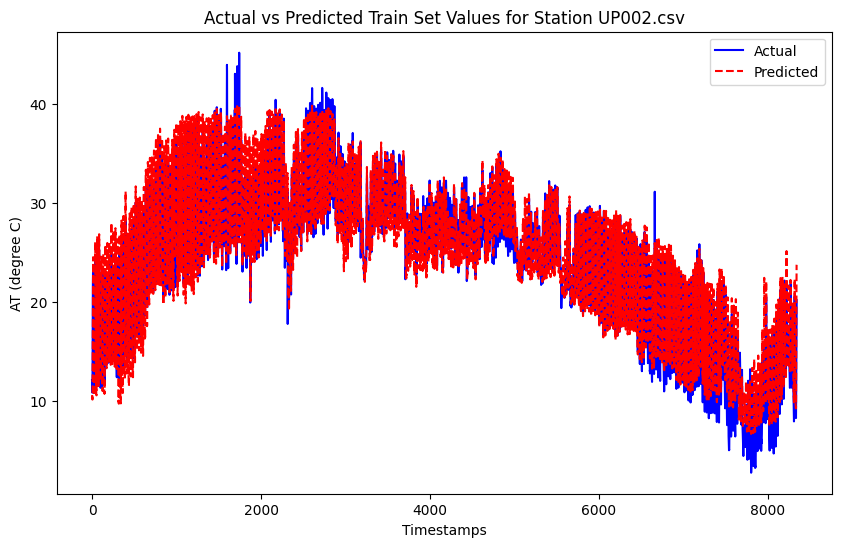

For Node 2:
UP003.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.3123
Mean Squared Error (MSE): 2.6686
Root Mean Squared Error (RMSE): 1.6336
Pearson Correlation Coefficient: 0.9823
R-squared (R²): 0.9649


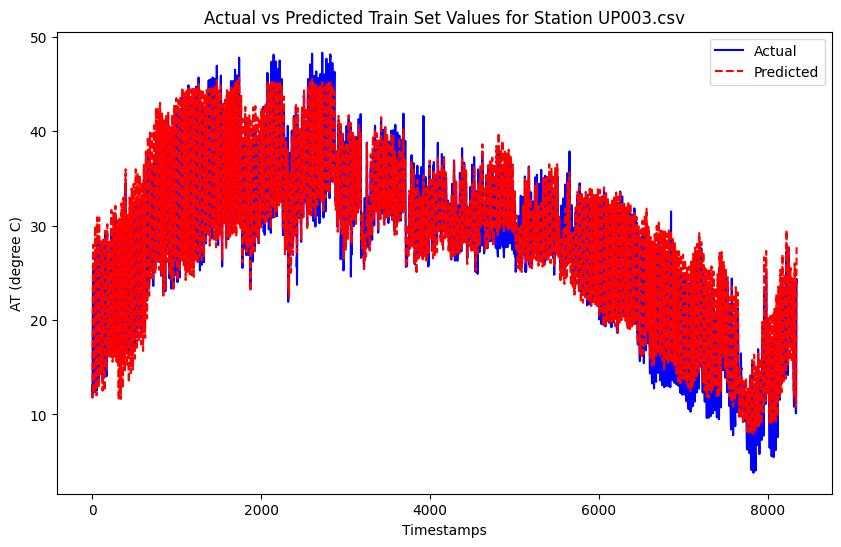

For Node 3:
UP004.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.2005
Mean Squared Error (MSE): 2.4523
Root Mean Squared Error (RMSE): 1.5660
Pearson Correlation Coefficient: 0.9853
R-squared (R²): 0.9707


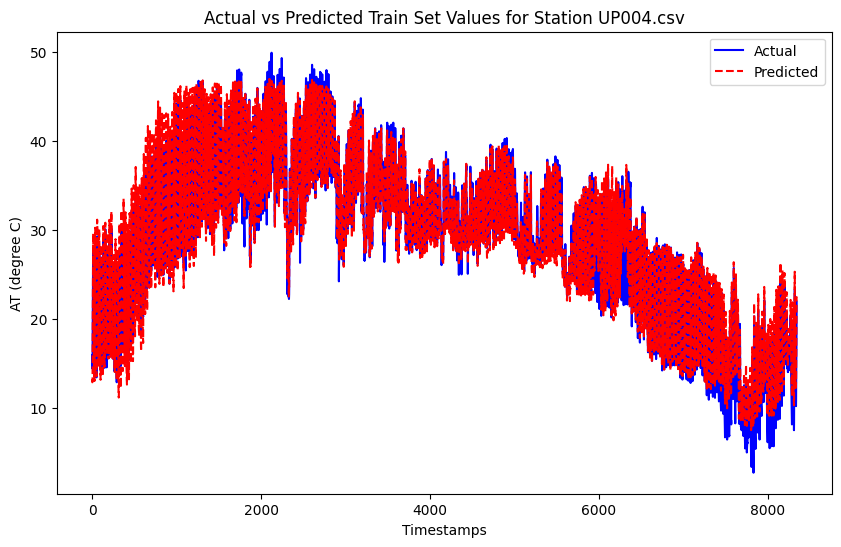

For Node 4:
UP008.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 5.2794
Mean Squared Error (MSE): 49.6987
Root Mean Squared Error (RMSE): 7.0497
Pearson Correlation Coefficient: 0.8252
R-squared (R²): 0.6691


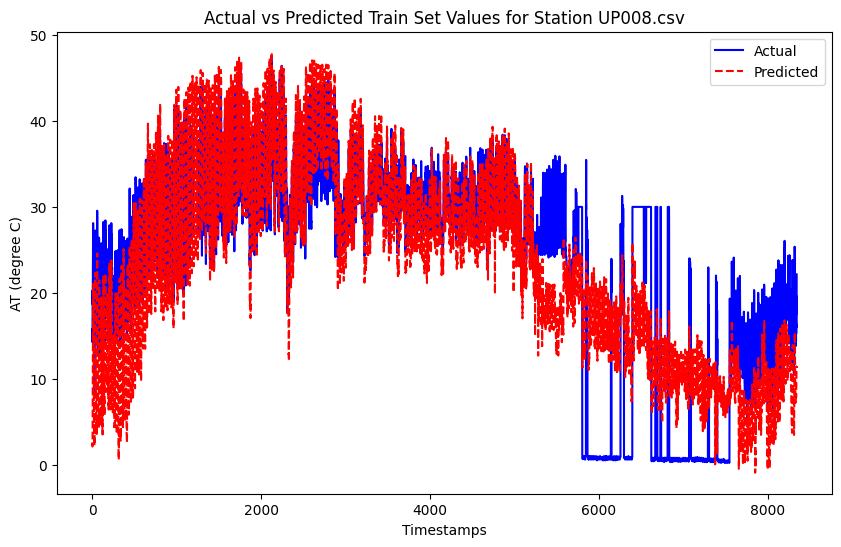

For Node 5:
UP009.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.0901
Mean Squared Error (MSE): 2.0615
Root Mean Squared Error (RMSE): 1.4358
Pearson Correlation Coefficient: 0.9835
R-squared (R²): 0.9661


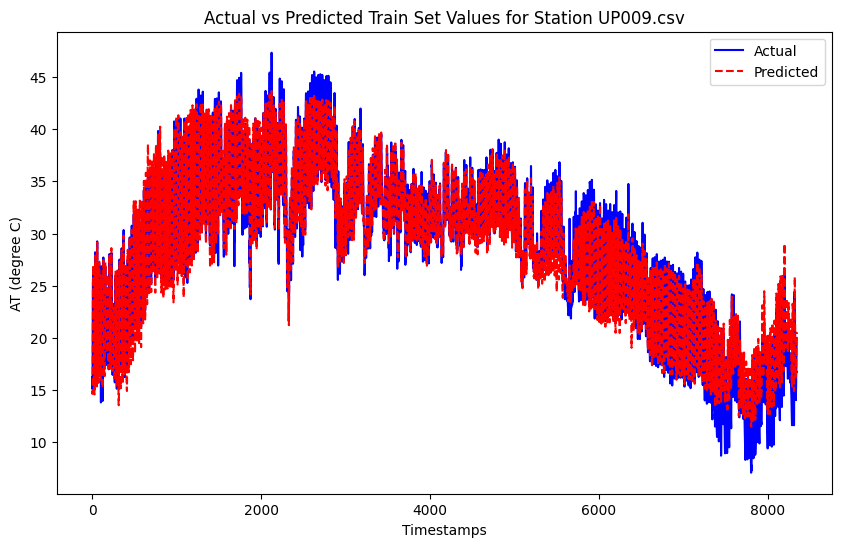

For Node 6:
UP012.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.7633
Mean Squared Error (MSE): 5.0537
Root Mean Squared Error (RMSE): 2.2480
Pearson Correlation Coefficient: 0.9765
R-squared (R²): 0.9533


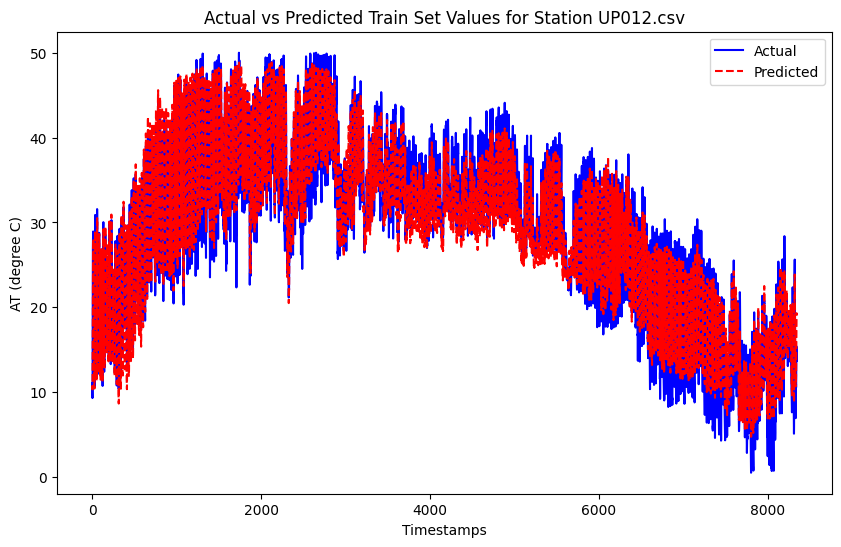

For Node 7:
UP014.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 3.0304
Mean Squared Error (MSE): 12.9369
Root Mean Squared Error (RMSE): 3.5968
Pearson Correlation Coefficient: 0.9503
R-squared (R²): 0.9026


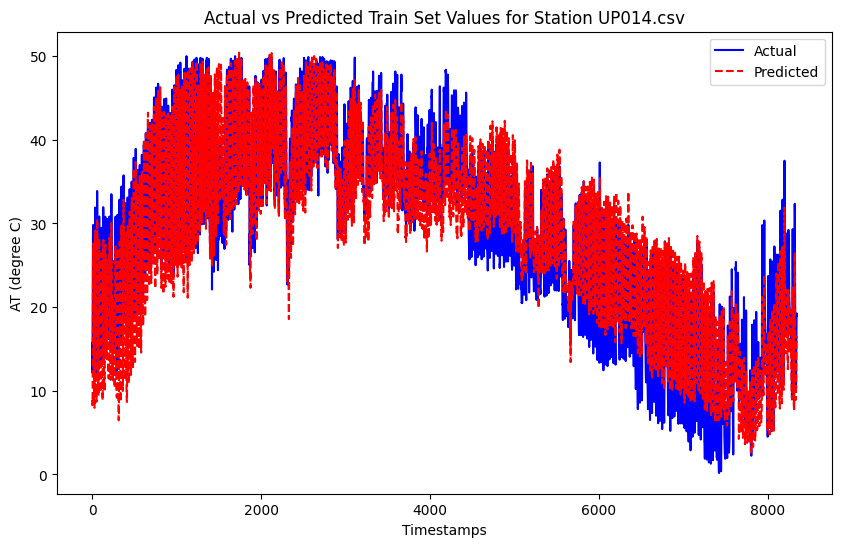

For Node 8:
UP016.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 2.8250
Mean Squared Error (MSE): 11.6802
Root Mean Squared Error (RMSE): 3.4176
Pearson Correlation Coefficient: 0.9563
R-squared (R²): 0.9144


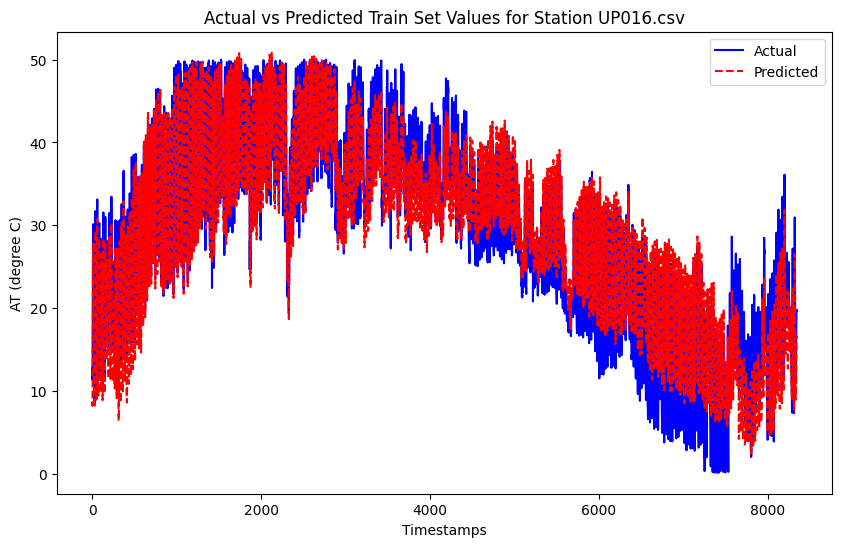

For Node 9:
UP017.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 0.8501
Mean Squared Error (MSE): 1.1221
Root Mean Squared Error (RMSE): 1.0593
Pearson Correlation Coefficient: 0.9830
R-squared (R²): 0.9657


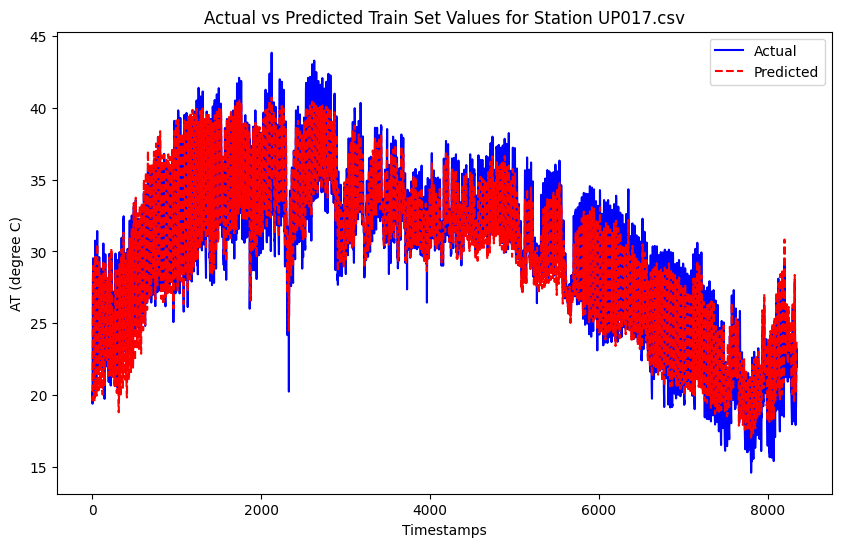

For Node 10:
UP018.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 3.9020
Mean Squared Error (MSE): 30.0034
Root Mean Squared Error (RMSE): 5.4775
Pearson Correlation Coefficient: 0.6640
R-squared (R²): 0.3786


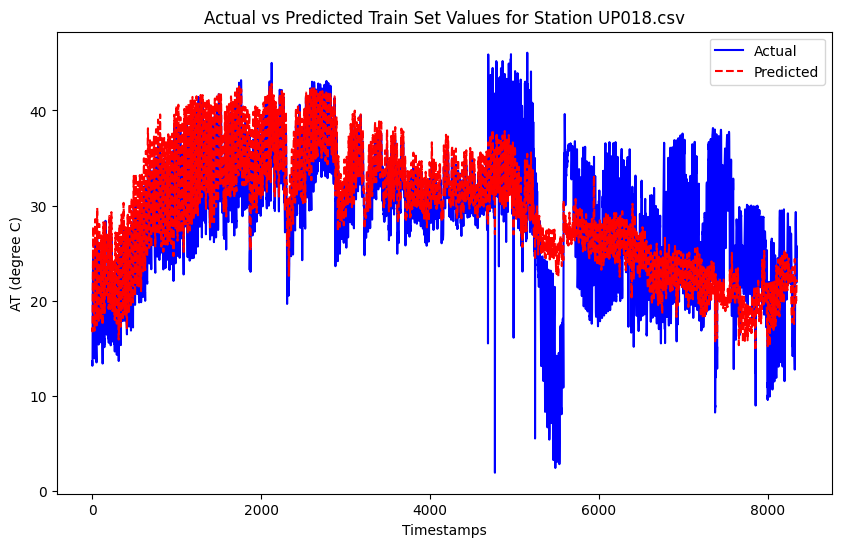

For Node 11:
UP019.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.7347
Mean Squared Error (MSE): 5.3891
Root Mean Squared Error (RMSE): 2.3214
Pearson Correlation Coefficient: 0.9273
R-squared (R²): 0.8594


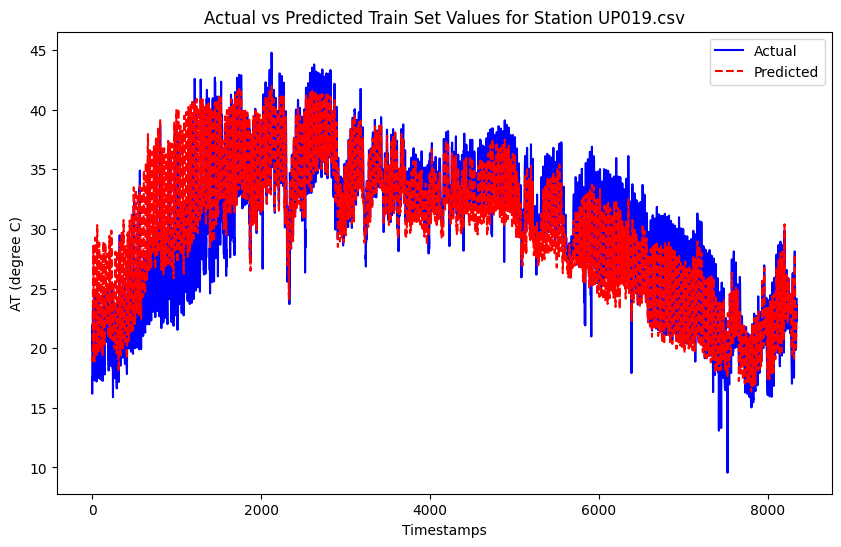

For Node 12:
UP020.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.5576
Mean Squared Error (MSE): 5.3459
Root Mean Squared Error (RMSE): 2.3121
Pearson Correlation Coefficient: 0.9526
R-squared (R²): 0.9059


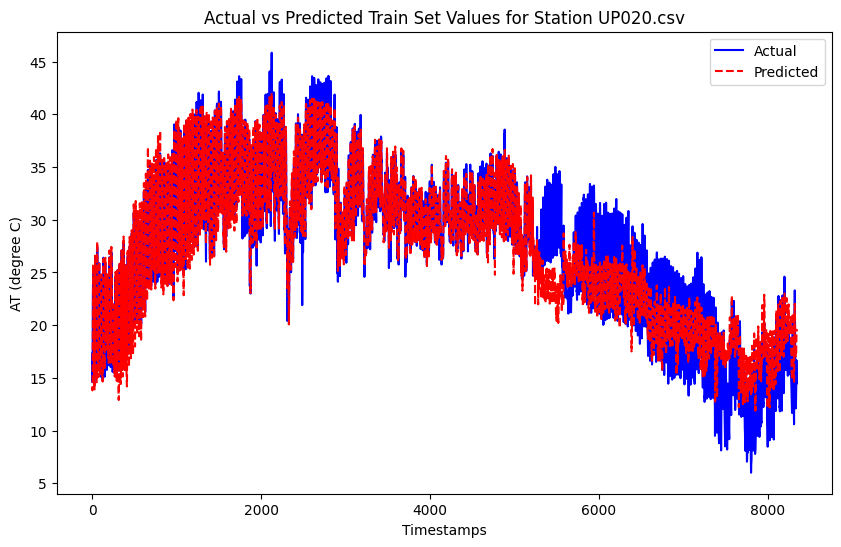

For Node 13:
UP021.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 3.8189
Mean Squared Error (MSE): 28.3461
Root Mean Squared Error (RMSE): 5.3241
Pearson Correlation Coefficient: 0.8091
R-squared (R²): 0.6428


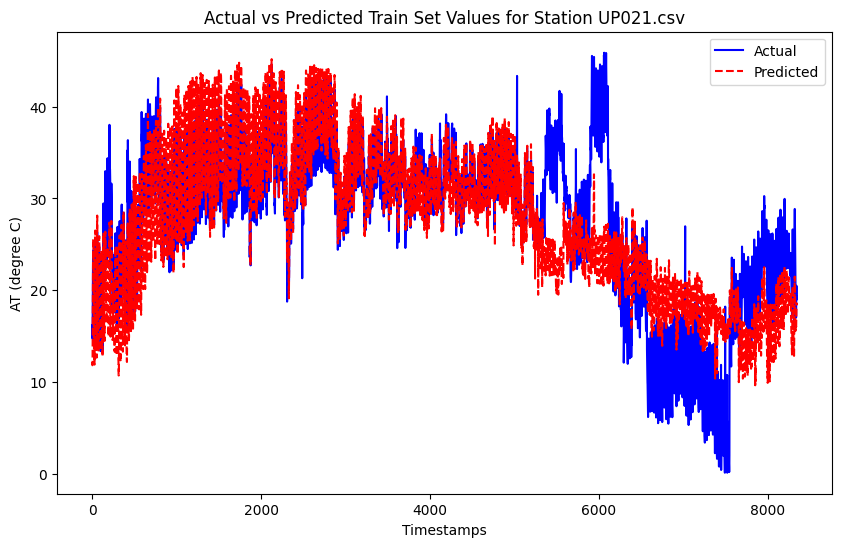

For Node 14:
UP022.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.6328
Mean Squared Error (MSE): 6.0566
Root Mean Squared Error (RMSE): 2.4610
Pearson Correlation Coefficient: 0.9463
R-squared (R²): 0.8942


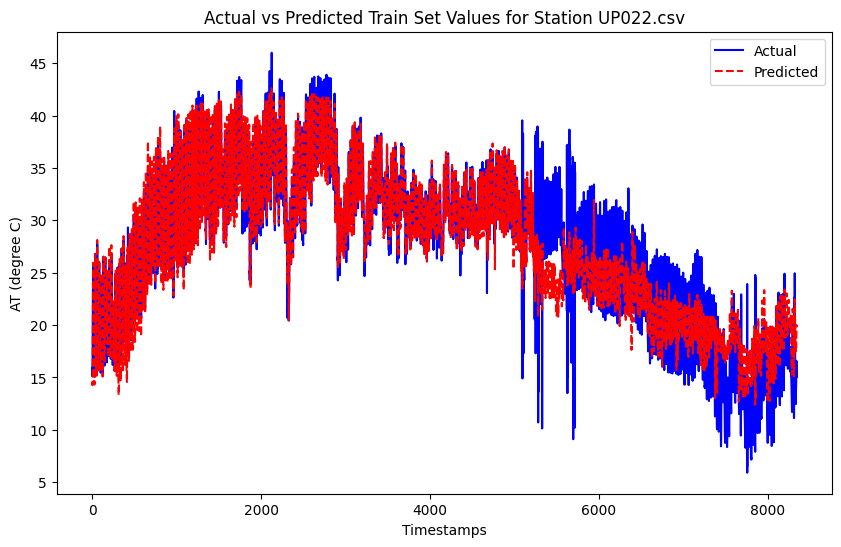

For Node 15:
UP023.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.3328
Mean Squared Error (MSE): 3.5406
Root Mean Squared Error (RMSE): 1.8816
Pearson Correlation Coefficient: 0.9700
R-squared (R²): 0.9409


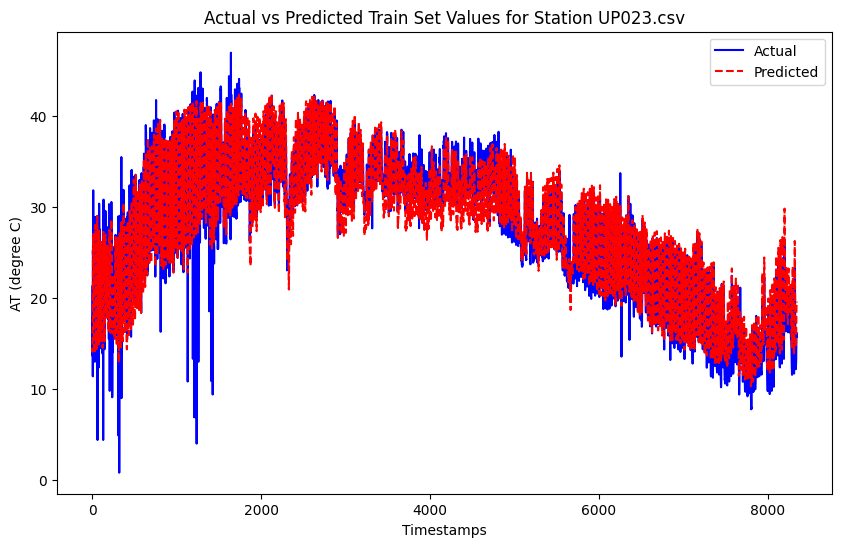

For Node 16:
UP024.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 2.4655
Mean Squared Error (MSE): 12.7247
Root Mean Squared Error (RMSE): 3.5672
Pearson Correlation Coefficient: 0.8360
R-squared (R²): 0.6792


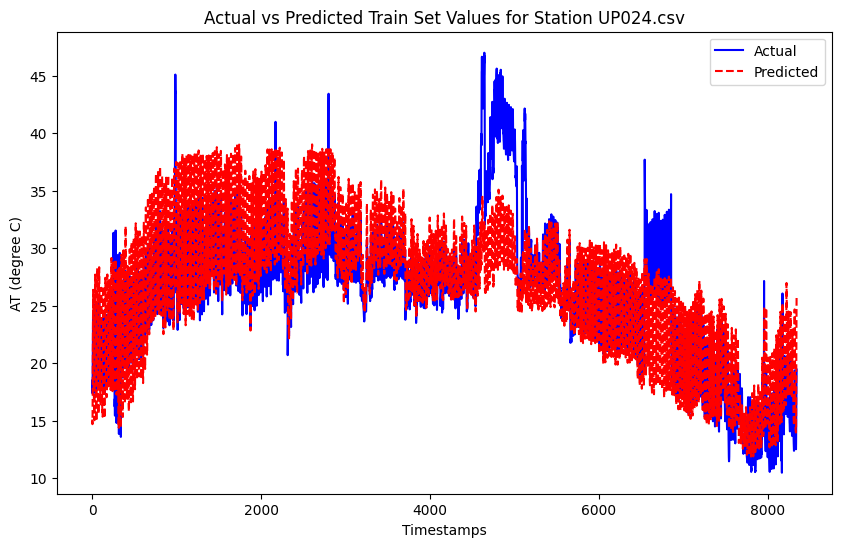

For Node 17:
UP025.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.1144
Mean Squared Error (MSE): 2.0728
Root Mean Squared Error (RMSE): 1.4397
Pearson Correlation Coefficient: 0.9825
R-squared (R²): 0.9651


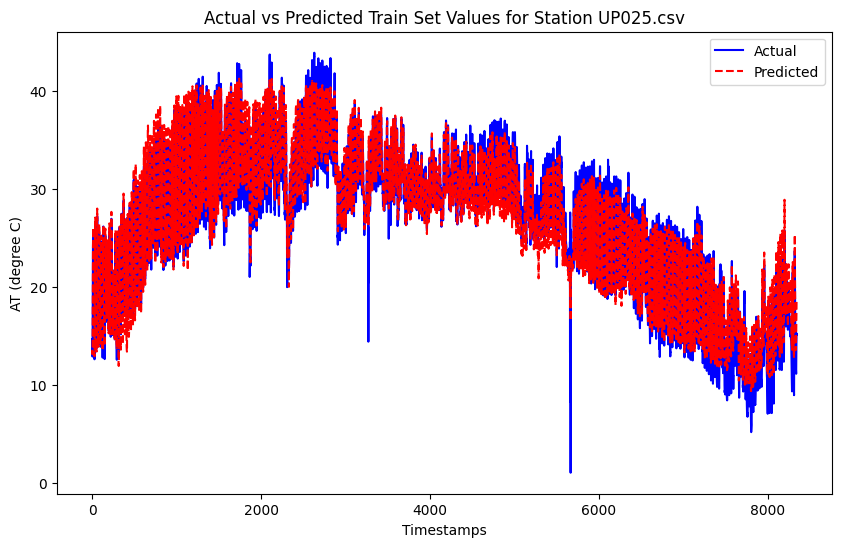

For Node 18:
UP026.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.2102
Mean Squared Error (MSE): 2.3137
Root Mean Squared Error (RMSE): 1.5211
Pearson Correlation Coefficient: 0.9830
R-squared (R²): 0.9662


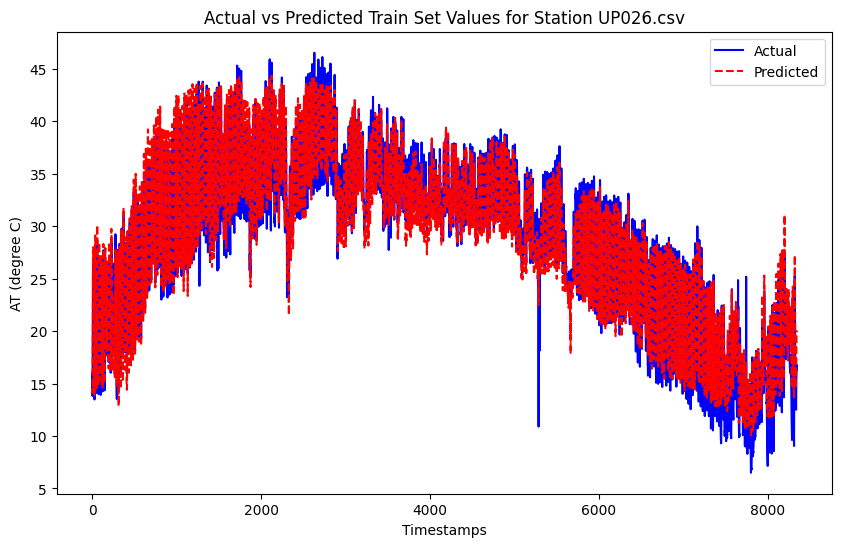

For Node 19:
UP028.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.7571
Mean Squared Error (MSE): 5.3547
Root Mean Squared Error (RMSE): 2.3140
Pearson Correlation Coefficient: 0.9708
R-squared (R²): 0.9424


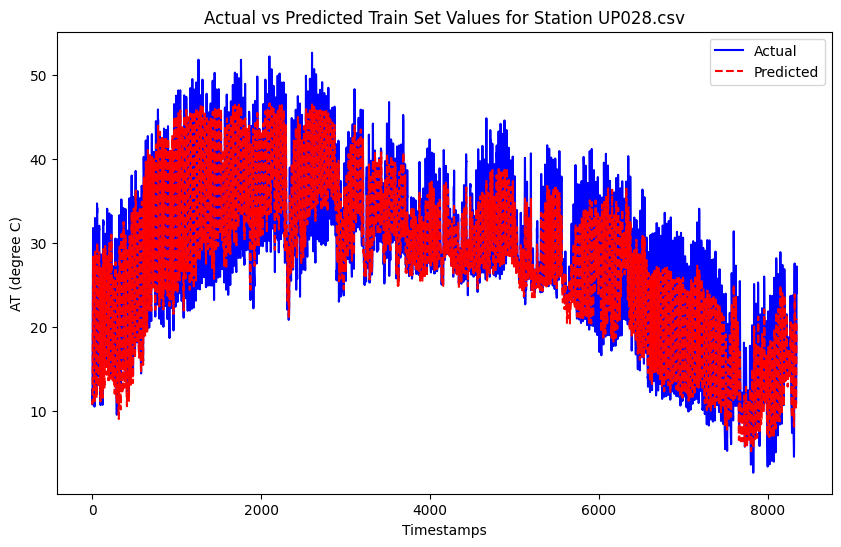

For Node 20:
UP029.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.0847
Mean Squared Error (MSE): 1.9507
Root Mean Squared Error (RMSE): 1.3967
Pearson Correlation Coefficient: 0.9839
R-squared (R²): 0.9679


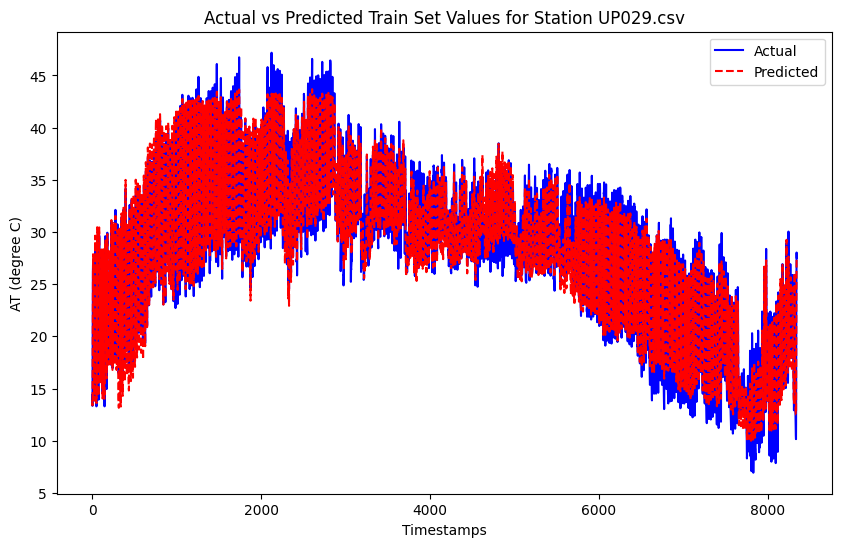

For Node 21:
UP030.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.3574
Mean Squared Error (MSE): 3.1680
Root Mean Squared Error (RMSE): 1.7799
Pearson Correlation Coefficient: 0.9804
R-squared (R²): 0.9612


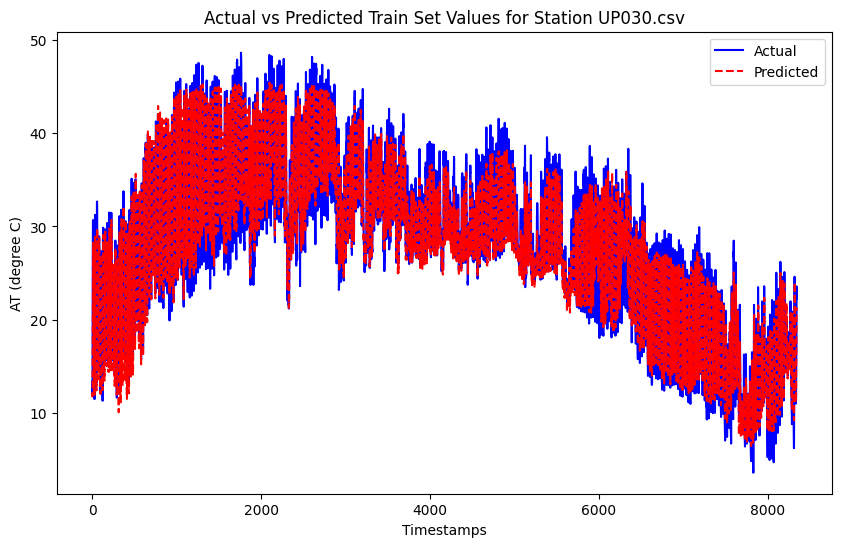

For Node 22:
UP031.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.6708
Mean Squared Error (MSE): 4.4230
Root Mean Squared Error (RMSE): 2.1031
Pearson Correlation Coefficient: 0.9672
R-squared (R²): 0.9354


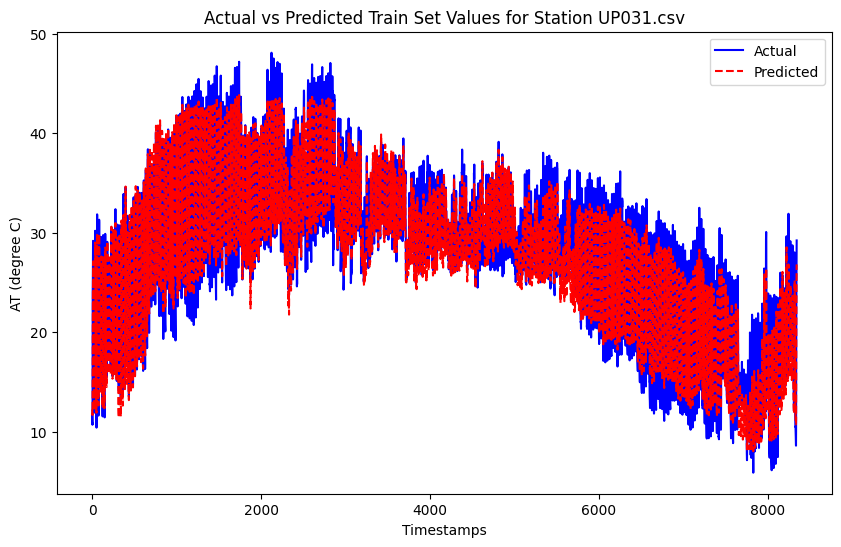

For Node 23:
UP032.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.6815
Mean Squared Error (MSE): 4.4058
Root Mean Squared Error (RMSE): 2.0990
Pearson Correlation Coefficient: 0.9582
R-squared (R²): 0.9177


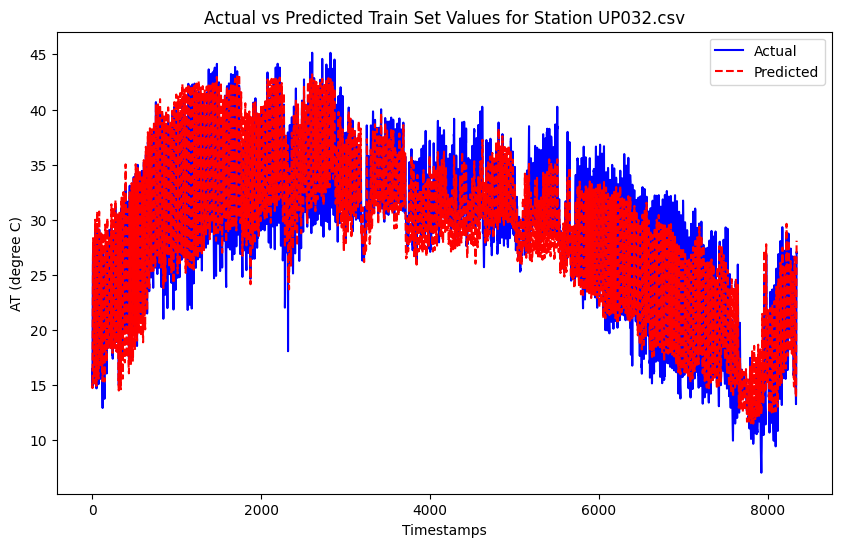

For Node 24:
UP033.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.0108
Mean Squared Error (MSE): 1.7190
Root Mean Squared Error (RMSE): 1.3111
Pearson Correlation Coefficient: 0.9864
R-squared (R²): 0.9728


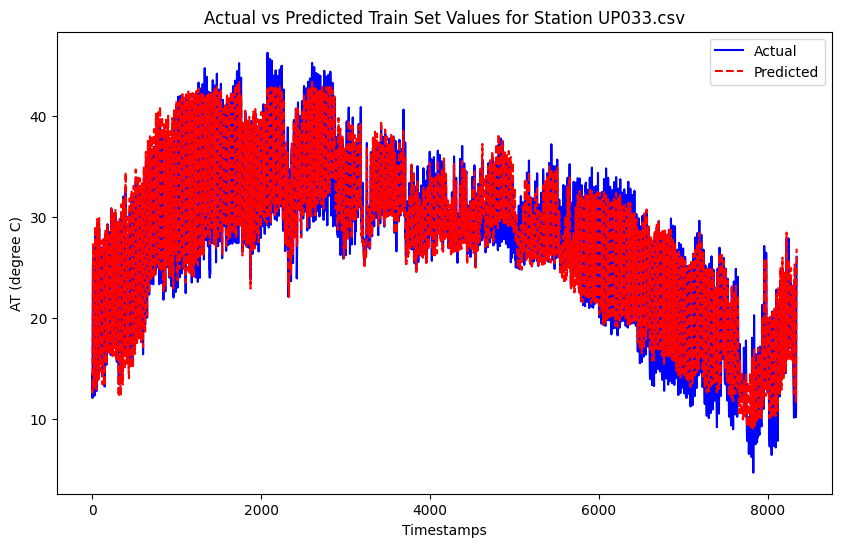

For Node 25:
UP034.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.8643
Mean Squared Error (MSE): 6.0509
Root Mean Squared Error (RMSE): 2.4599
Pearson Correlation Coefficient: 0.9666
R-squared (R²): 0.9341


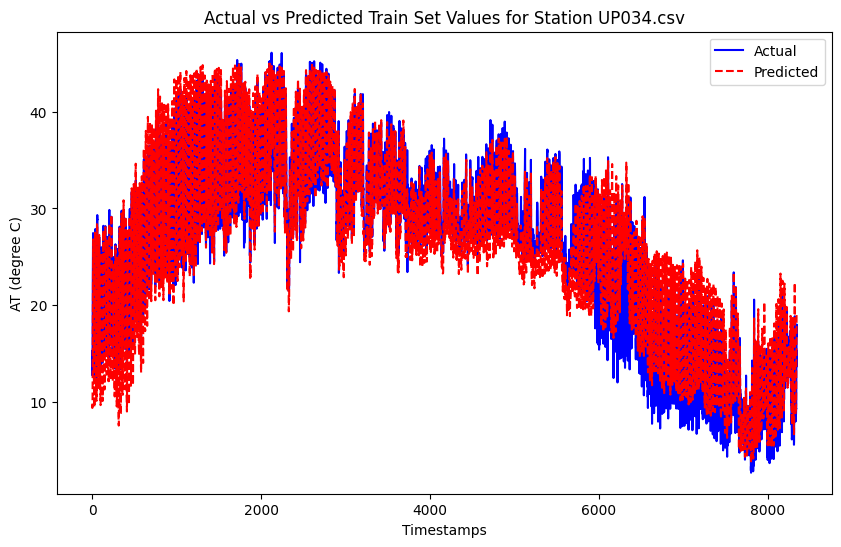

For Node 26:
UP035.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.3240
Mean Squared Error (MSE): 2.6681
Root Mean Squared Error (RMSE): 1.6334
Pearson Correlation Coefficient: 0.9808
R-squared (R²): 0.9619


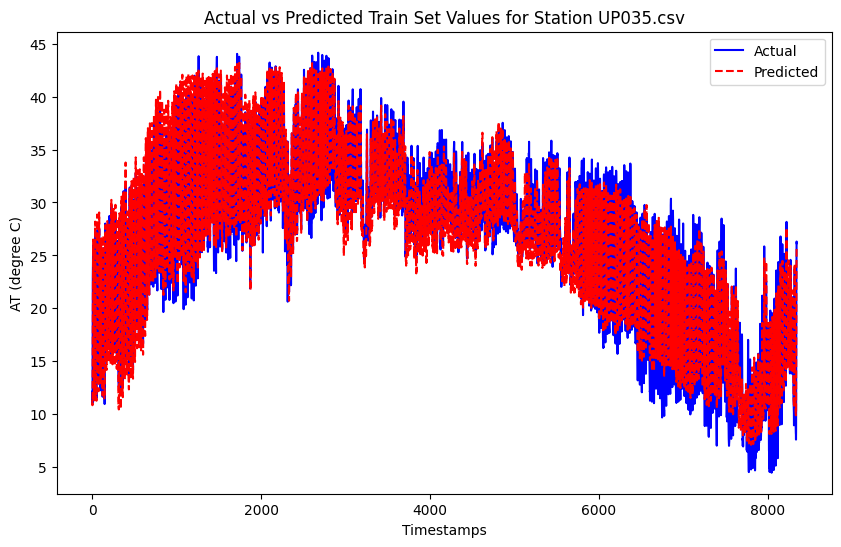

For Node 27:
UP036.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.0385
Mean Squared Error (MSE): 1.8863
Root Mean Squared Error (RMSE): 1.3734
Pearson Correlation Coefficient: 0.9847
R-squared (R²): 0.9694


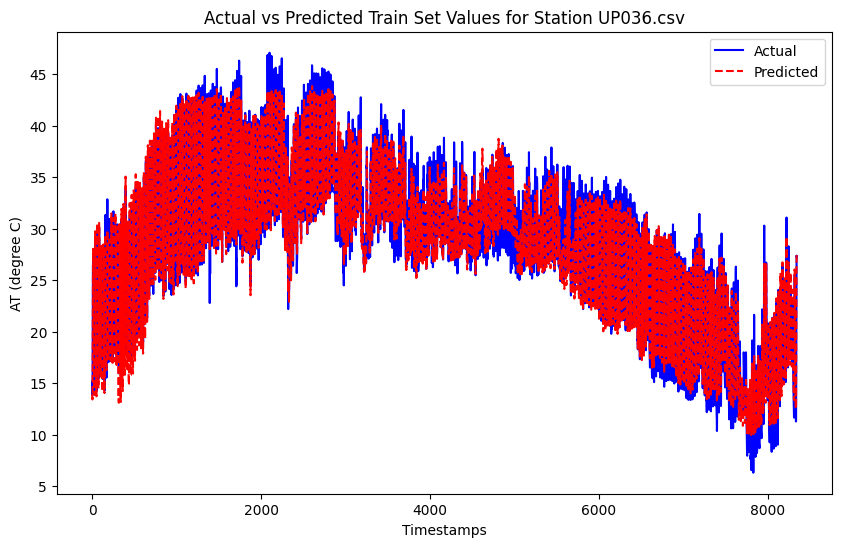

For Node 28:
UP037.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.3171
Mean Squared Error (MSE): 2.8342
Root Mean Squared Error (RMSE): 1.6835
Pearson Correlation Coefficient: 0.9816
R-squared (R²): 0.9635


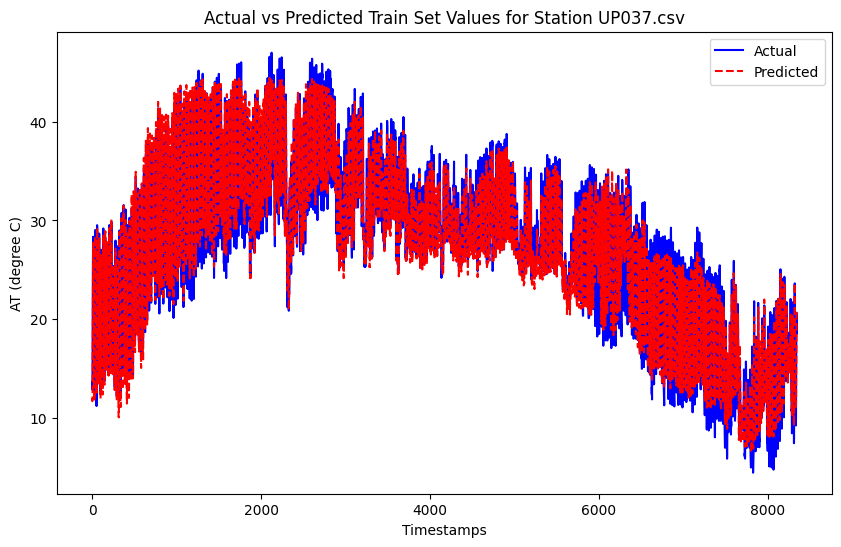

For Node 29:
UP038.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.0527
Mean Squared Error (MSE): 1.9702
Root Mean Squared Error (RMSE): 1.4037
Pearson Correlation Coefficient: 0.9835
R-squared (R²): 0.9673


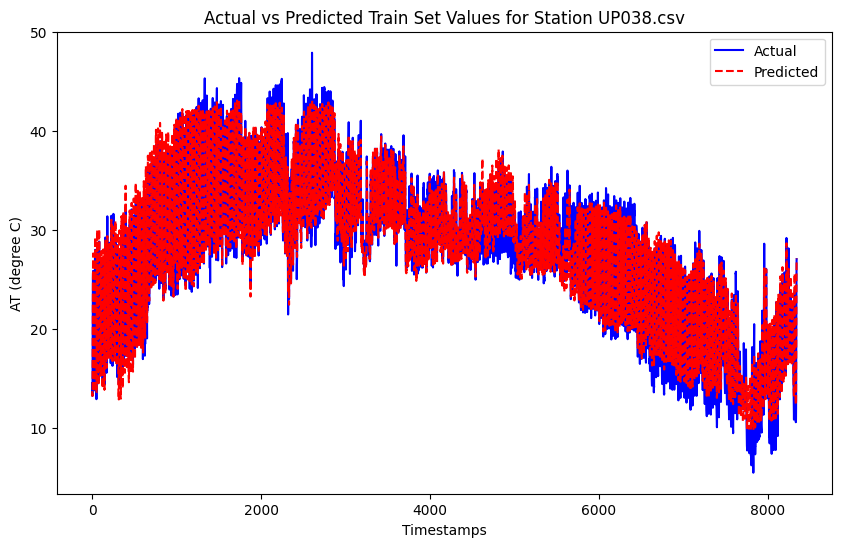

For Node 30:
UP039.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.7892
Mean Squared Error (MSE): 4.9677
Root Mean Squared Error (RMSE): 2.2288
Pearson Correlation Coefficient: 0.9683
R-squared (R²): 0.9375


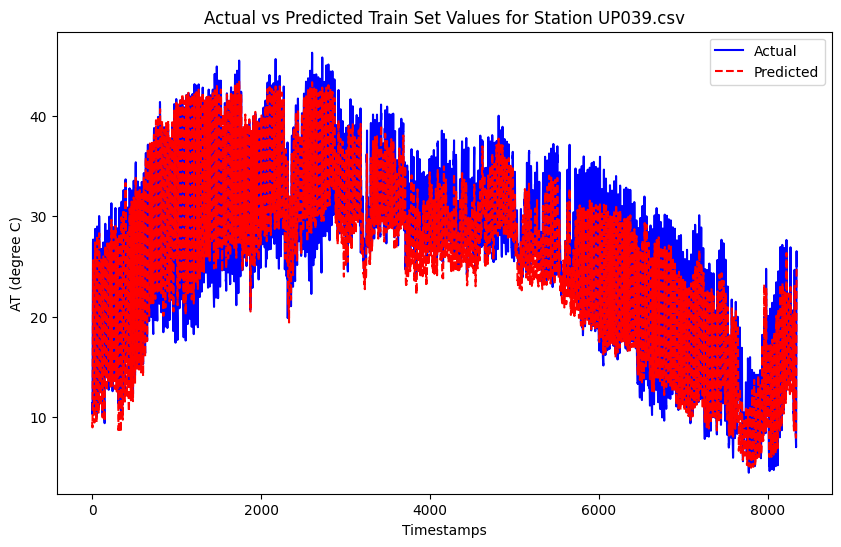

For Node 31:
UP040.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.4772
Mean Squared Error (MSE): 3.4470
Root Mean Squared Error (RMSE): 1.8566
Pearson Correlation Coefficient: 0.9783
R-squared (R²): 0.9571


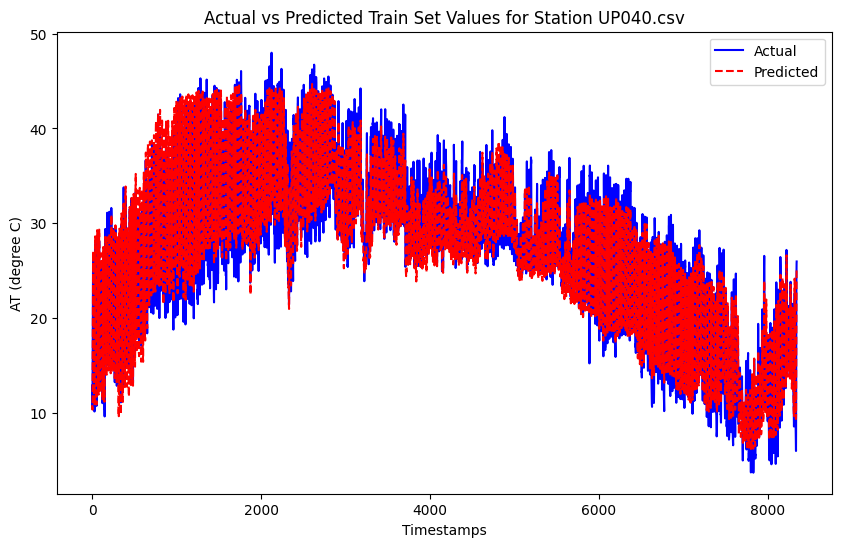

For Node 32:
UP041.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.1320
Mean Squared Error (MSE): 2.0985
Root Mean Squared Error (RMSE): 1.4486
Pearson Correlation Coefficient: 0.9817
R-squared (R²): 0.9637


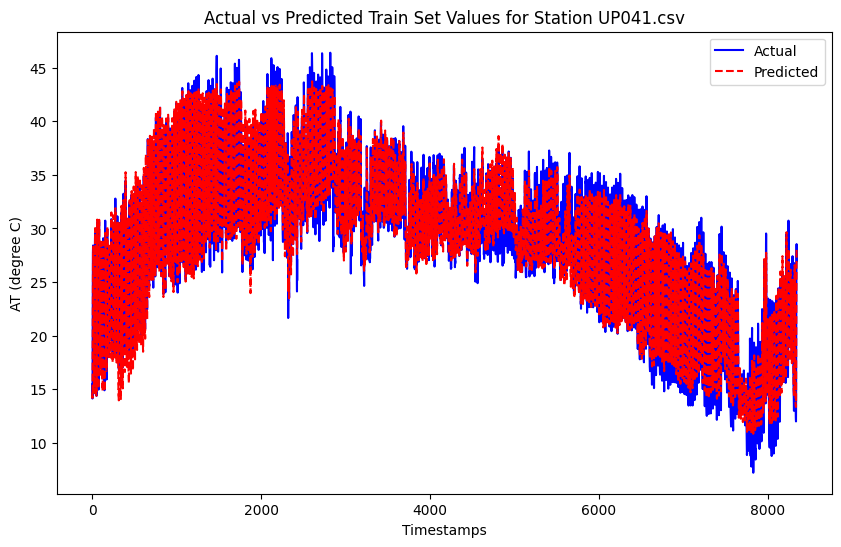

For Node 33:
UP042.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.2404
Mean Squared Error (MSE): 2.8975
Root Mean Squared Error (RMSE): 1.7022
Pearson Correlation Coefficient: 0.9786
R-squared (R²): 0.9577


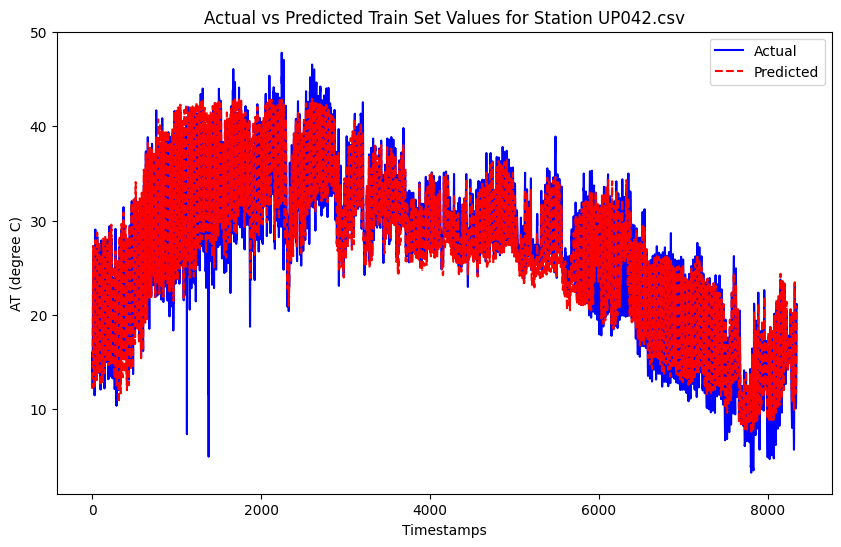

For Node 34:
UP043.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.3601
Mean Squared Error (MSE): 3.0307
Root Mean Squared Error (RMSE): 1.7409
Pearson Correlation Coefficient: 0.9796
R-squared (R²): 0.9596


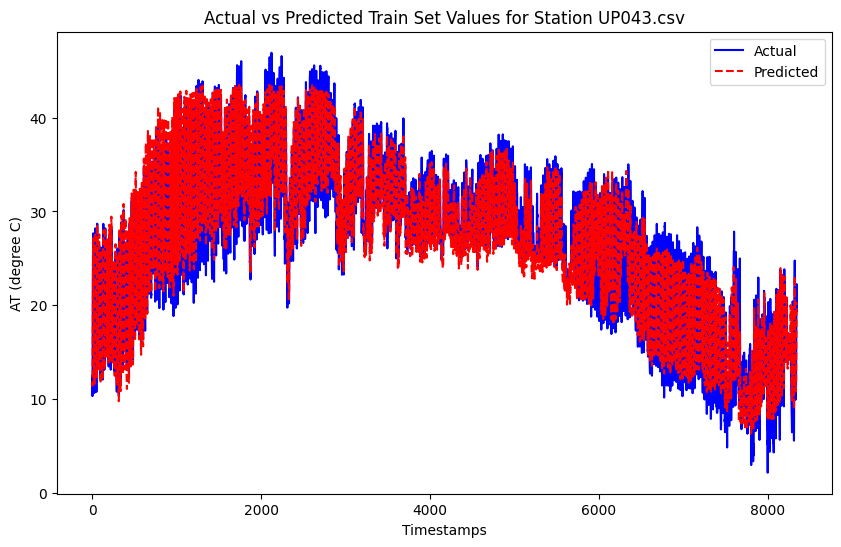

For Node 35:
UP044.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.2417
Mean Squared Error (MSE): 2.4272
Root Mean Squared Error (RMSE): 1.5579
Pearson Correlation Coefficient: 0.9843
R-squared (R²): 0.9687


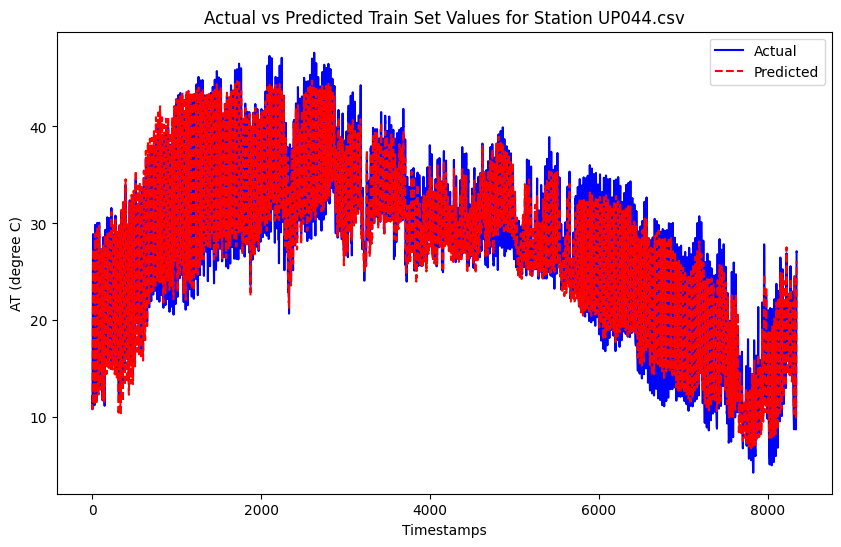

For Node 36:
UP046.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.5390
Mean Squared Error (MSE): 3.8192
Root Mean Squared Error (RMSE): 1.9543
Pearson Correlation Coefficient: 0.9722
R-squared (R²): 0.9452


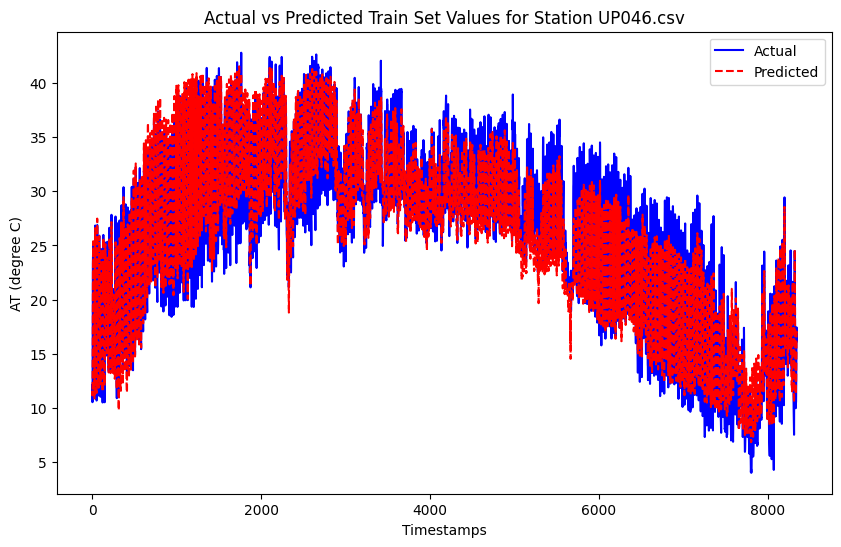

For Node 37:
UP048.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.6764
Mean Squared Error (MSE): 4.6316
Root Mean Squared Error (RMSE): 2.1521
Pearson Correlation Coefficient: 0.9649
R-squared (R²): 0.9309


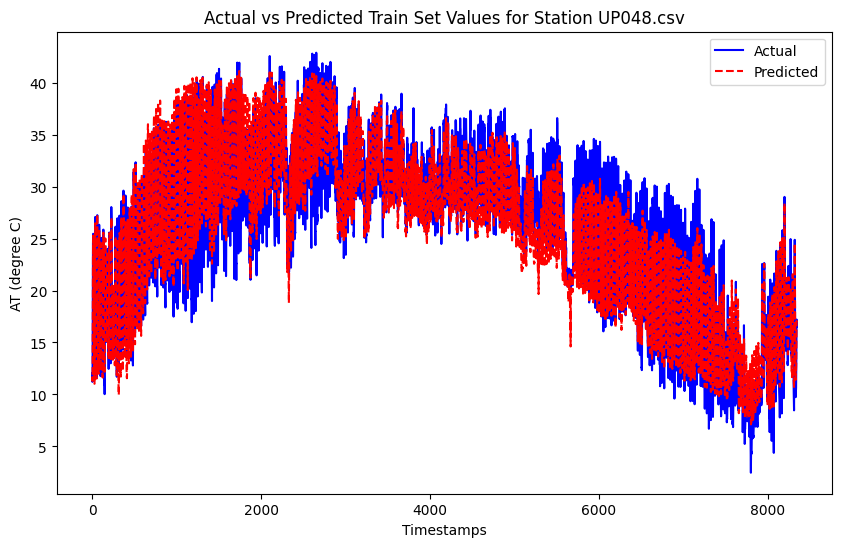

For Node 38:
UP049.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.6945
Mean Squared Error (MSE): 4.2946
Root Mean Squared Error (RMSE): 2.0723
Pearson Correlation Coefficient: 0.9695
R-squared (R²): 0.9398


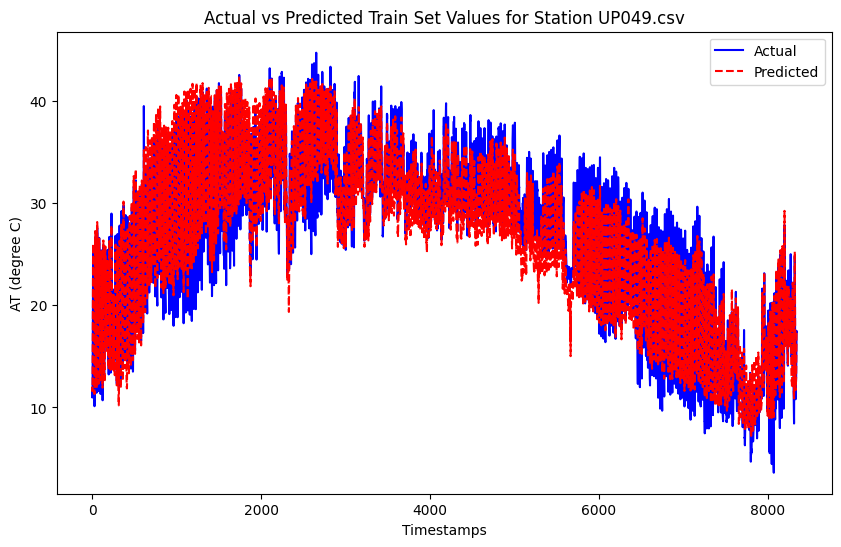

For Node 39:
UP050.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.5606
Mean Squared Error (MSE): 4.2854
Root Mean Squared Error (RMSE): 2.0701
Pearson Correlation Coefficient: 0.9640
R-squared (R²): 0.9292


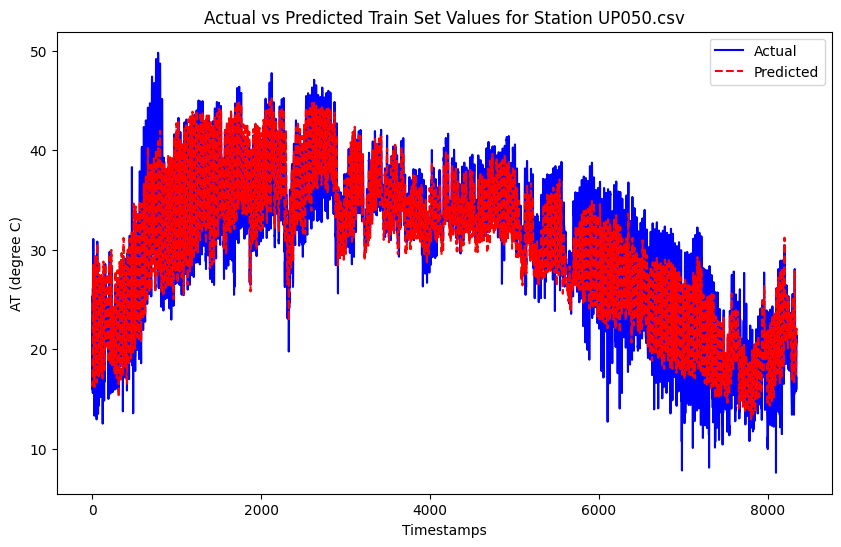

For Node 40:
UP051.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 2.3197
Mean Squared Error (MSE): 19.0010
Root Mean Squared Error (RMSE): 4.3590
Pearson Correlation Coefficient: 0.8650
R-squared (R²): 0.7348


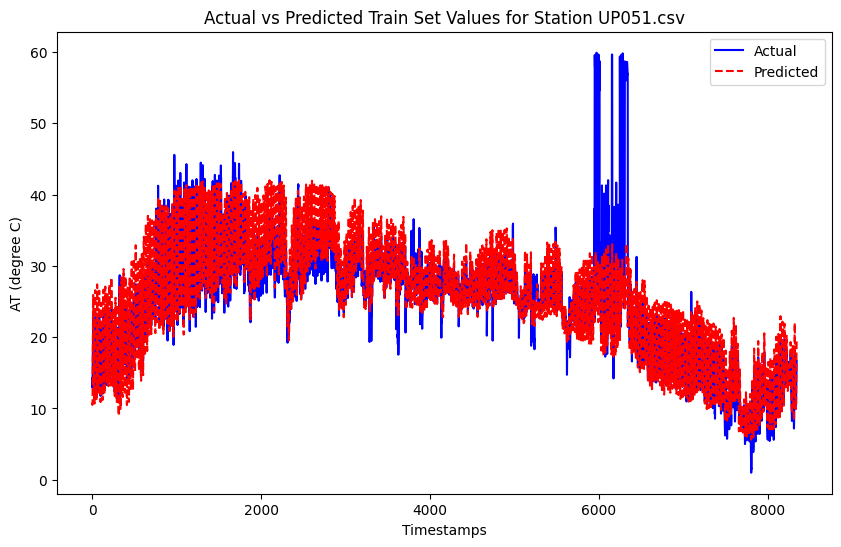

For Node 41:
UP052.csv Performance Metrics (Train Set):
Mean Absolute Error (MAE): 1.4870
Mean Squared Error (MSE): 3.7655
Root Mean Squared Error (RMSE): 1.9405
Pearson Correlation Coefficient: 0.9723
R-squared (R²): 0.9453


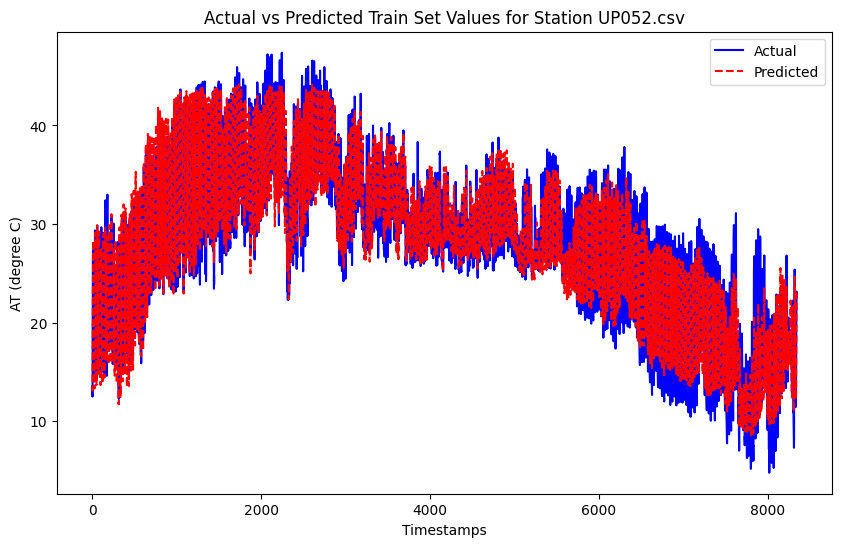

For Node 1:
UP002.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.6618
Mean Squared Error (MSE): 3.8342
Root Mean Squared Error (RMSE): 1.9581
Pearson Correlation Coefficient: 0.9696
R-squared (R²): 0.8649


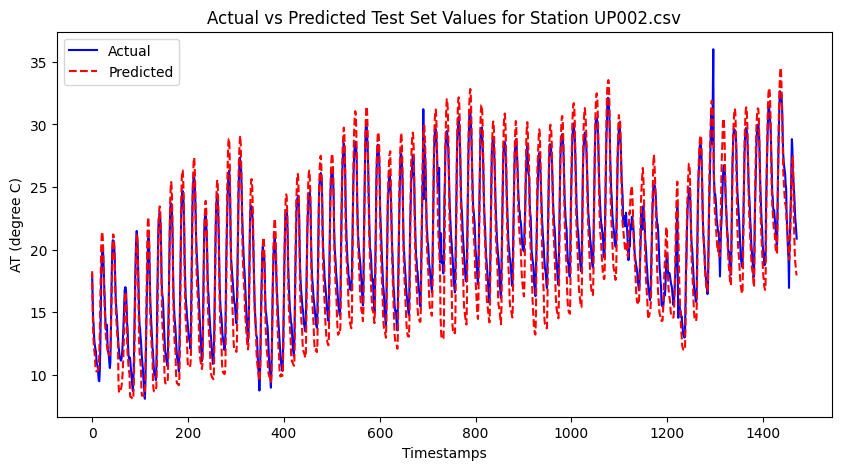

For Node 2:
UP003.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.9326
Mean Squared Error (MSE): 4.9727
Root Mean Squared Error (RMSE): 2.2300
Pearson Correlation Coefficient: 0.9742
R-squared (R²): 0.8683


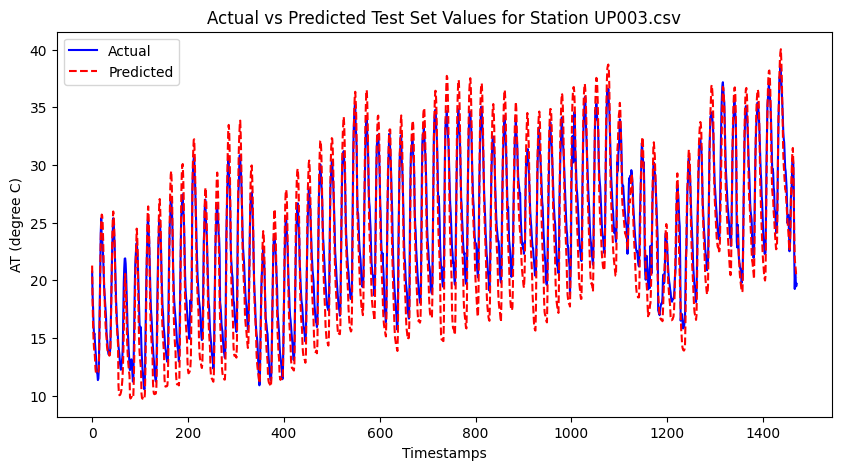

For Node 3:
UP004.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.9816
Mean Squared Error (MSE): 5.9070
Root Mean Squared Error (RMSE): 2.4304
Pearson Correlation Coefficient: 0.9558
R-squared (R²): 0.8280


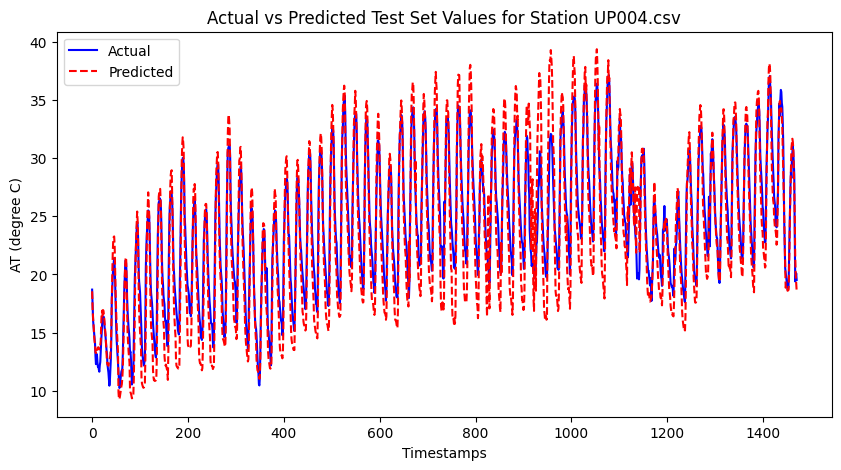

For Node 4:
UP008.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 8.5065
Mean Squared Error (MSE): 81.5549
Root Mean Squared Error (RMSE): 9.0308
Pearson Correlation Coefficient: 0.7791
R-squared (R²): -2.7671


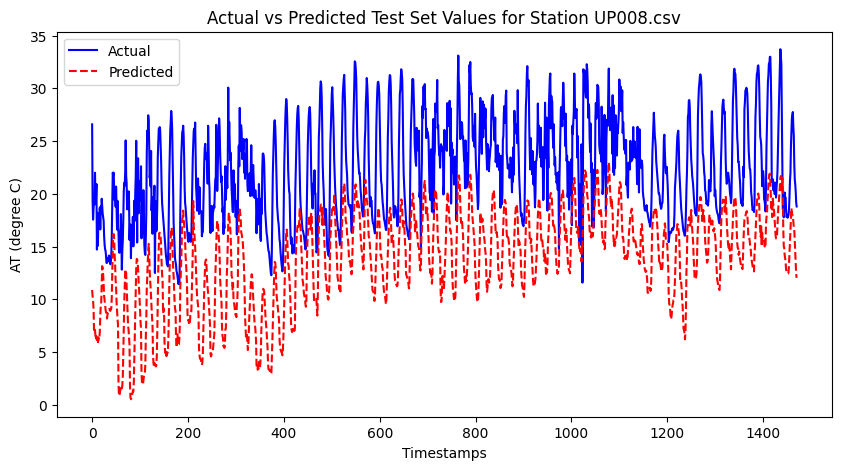

For Node 5:
UP009.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.1524
Mean Squared Error (MSE): 2.2091
Root Mean Squared Error (RMSE): 1.4863
Pearson Correlation Coefficient: 0.9619
R-squared (R²): 0.8952


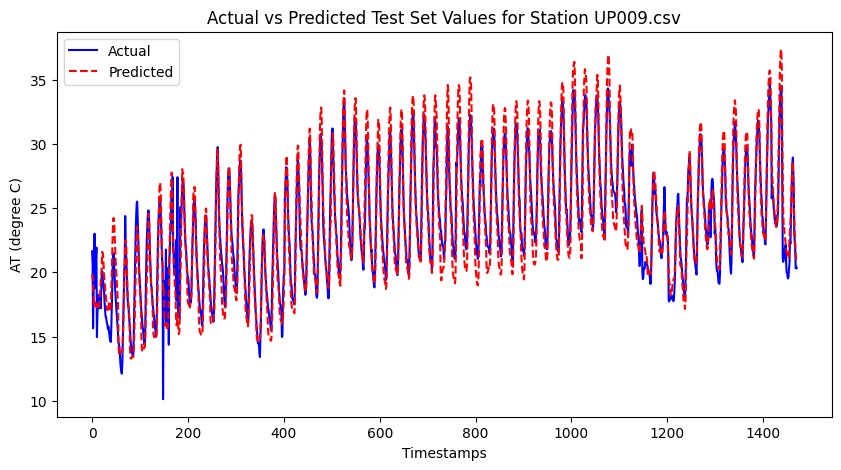

For Node 6:
UP012.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.7339
Mean Squared Error (MSE): 5.0202
Root Mean Squared Error (RMSE): 2.2406
Pearson Correlation Coefficient: 0.9595
R-squared (R²): 0.8861


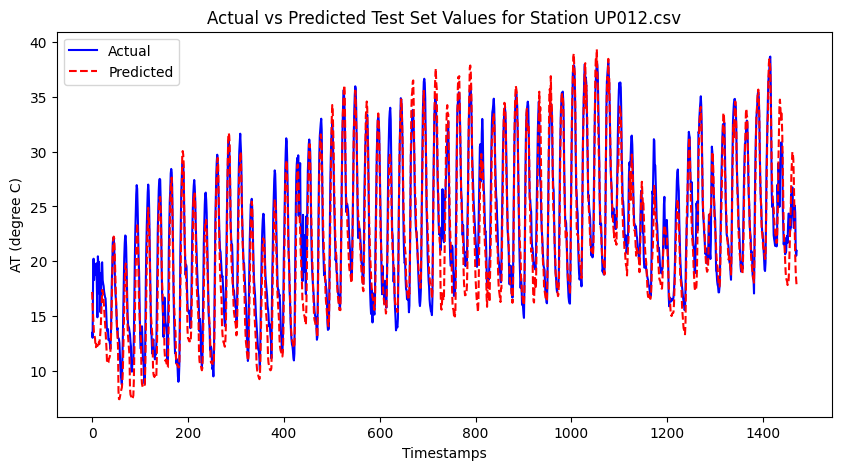

For Node 7:
UP014.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 5.9942
Mean Squared Error (MSE): 39.3762
Root Mean Squared Error (RMSE): 6.2750
Pearson Correlation Coefficient: 0.9662
R-squared (R²): 0.3809


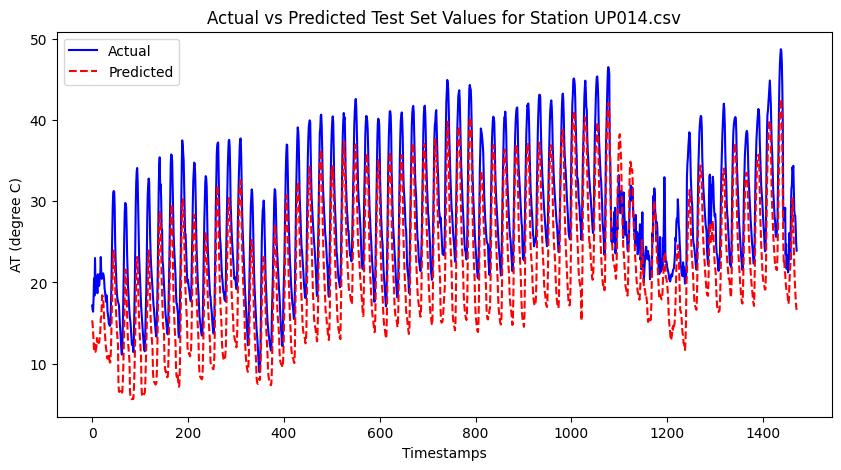

For Node 8:
UP016.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 5.1623
Mean Squared Error (MSE): 30.0430
Root Mean Squared Error (RMSE): 5.4812
Pearson Correlation Coefficient: 0.9732
R-squared (R²): 0.5138


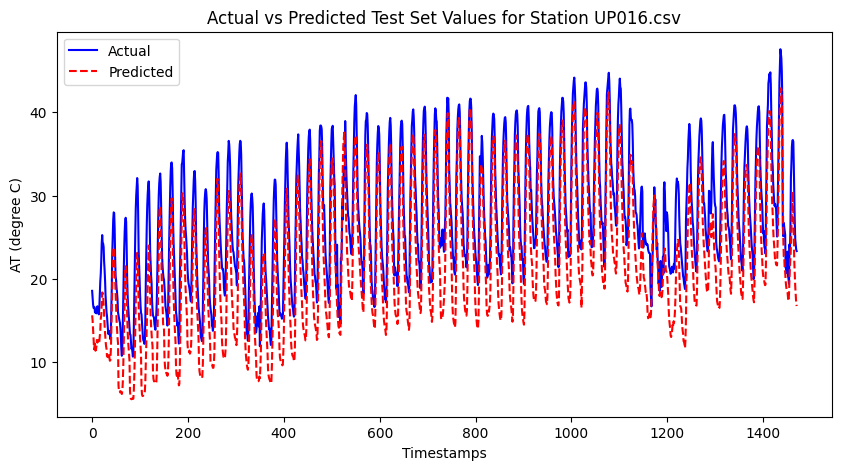

For Node 9:
UP017.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 0.8644
Mean Squared Error (MSE): 1.2106
Root Mean Squared Error (RMSE): 1.1003
Pearson Correlation Coefficient: 0.9636
R-squared (R²): 0.9105


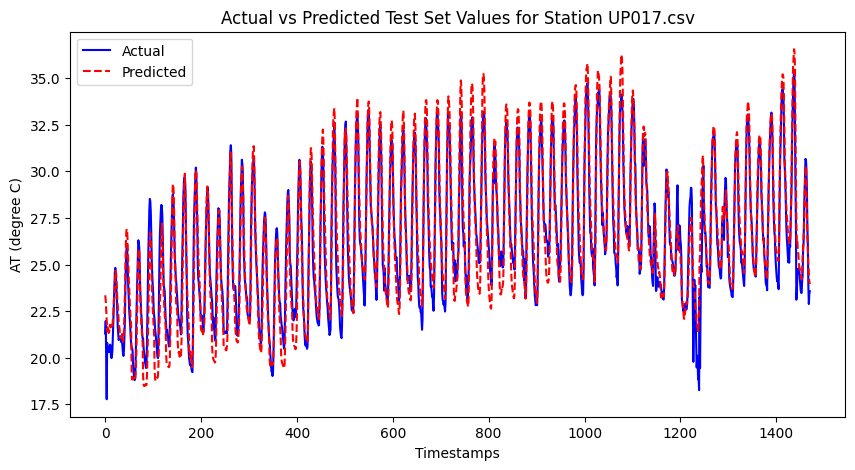

For Node 10:
UP018.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 6.7416
Mean Squared Error (MSE): 66.4988
Root Mean Squared Error (RMSE): 8.1547
Pearson Correlation Coefficient: -0.4993
R-squared (R²): -1.4496


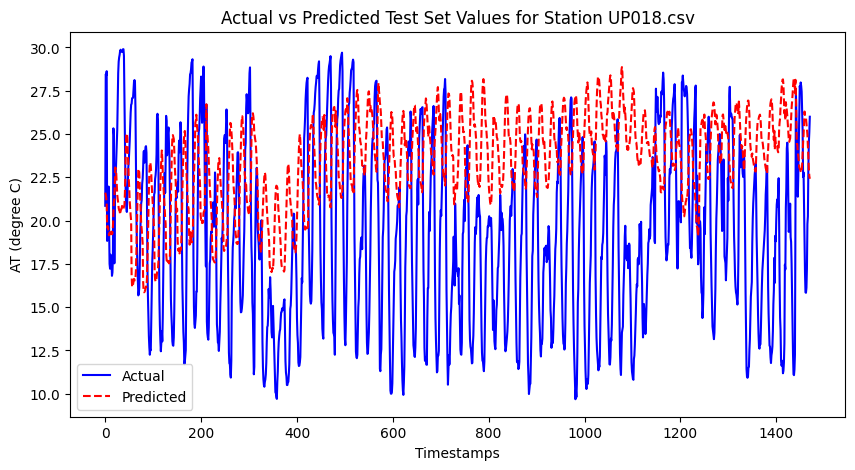

For Node 11:
UP019.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 2.1266
Mean Squared Error (MSE): 5.5692
Root Mean Squared Error (RMSE): 2.3599
Pearson Correlation Coefficient: 0.9468
R-squared (R²): 0.6683


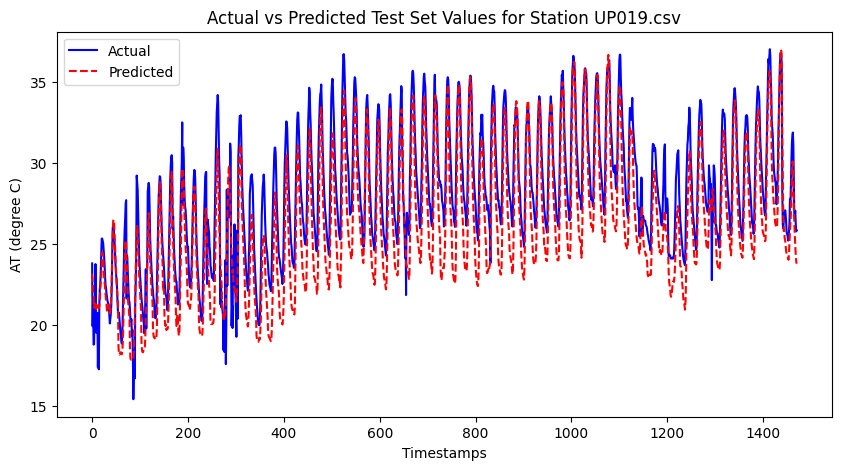

For Node 12:
UP020.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 2.2009
Mean Squared Error (MSE): 7.8219
Root Mean Squared Error (RMSE): 2.7968
Pearson Correlation Coefficient: 0.9153
R-squared (R²): 0.6101


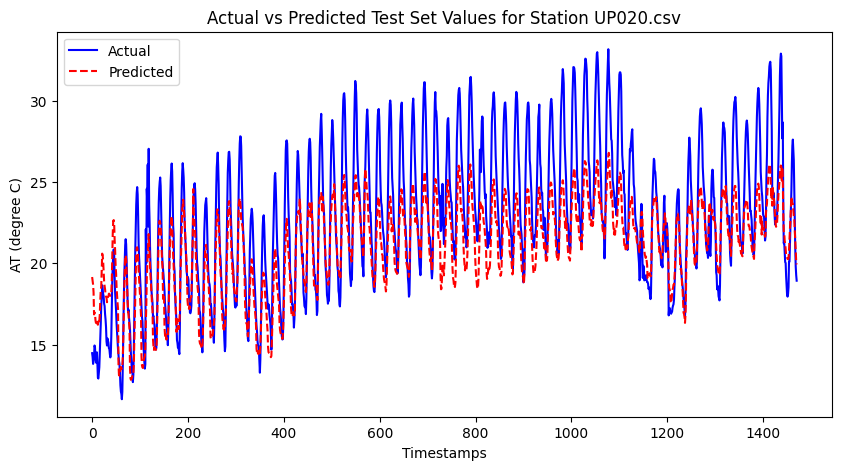

For Node 13:
UP021.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 5.3161
Mean Squared Error (MSE): 34.9108
Root Mean Squared Error (RMSE): 5.9085
Pearson Correlation Coefficient: 0.7998
R-squared (R²): -0.8624


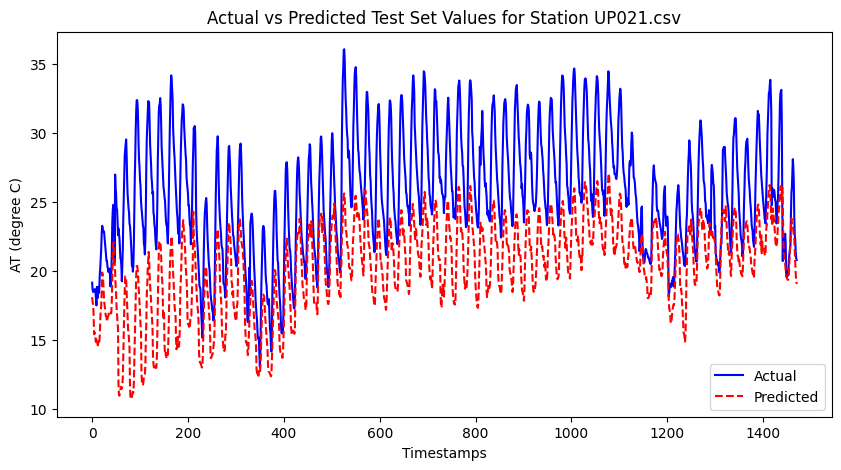

For Node 14:
UP022.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 2.1238
Mean Squared Error (MSE): 7.2866
Root Mean Squared Error (RMSE): 2.6994
Pearson Correlation Coefficient: 0.9158
R-squared (R²): 0.6255


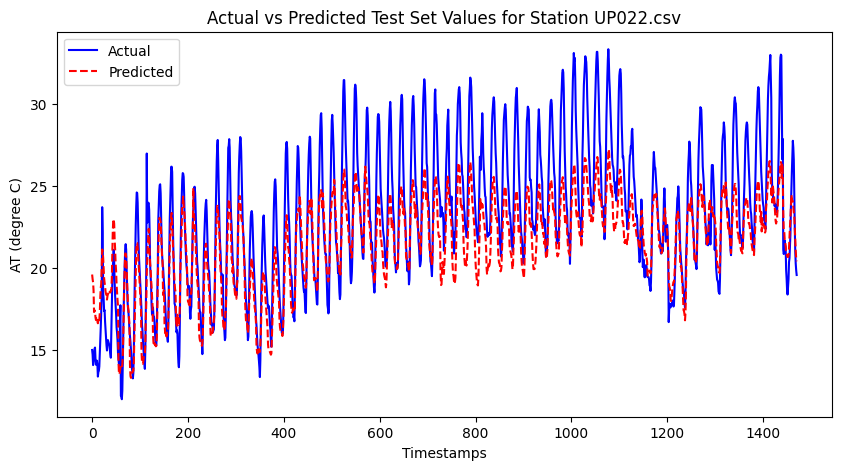

For Node 15:
UP023.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.7144
Mean Squared Error (MSE): 4.6835
Root Mean Squared Error (RMSE): 2.1641
Pearson Correlation Coefficient: 0.9732
R-squared (R²): 0.7339


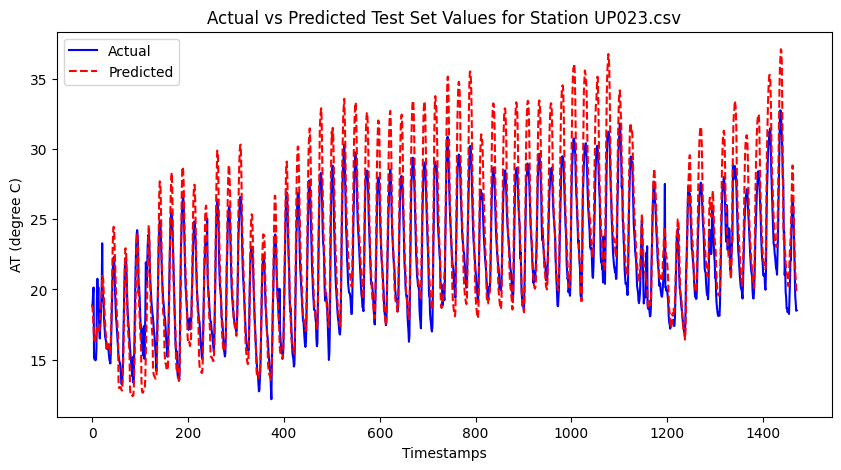

For Node 16:
UP024.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 2.9871
Mean Squared Error (MSE): 14.4205
Root Mean Squared Error (RMSE): 3.7974
Pearson Correlation Coefficient: 0.9596
R-squared (R²): -0.6065


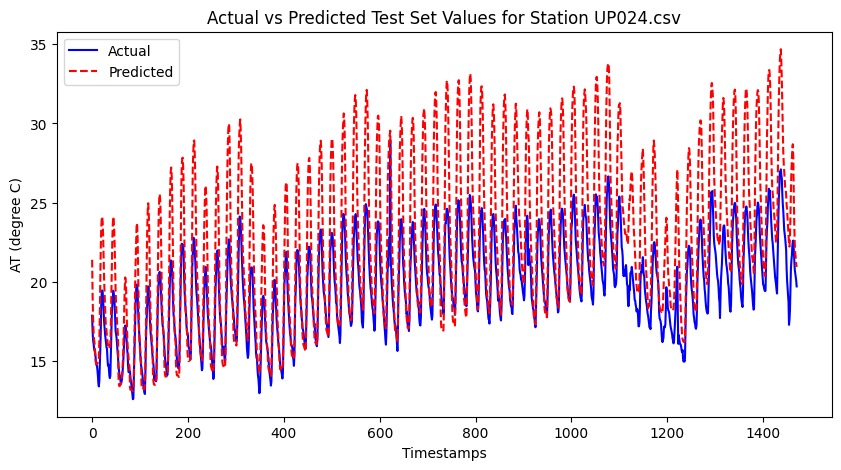

For Node 17:
UP025.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.0921
Mean Squared Error (MSE): 2.0324
Root Mean Squared Error (RMSE): 1.4256
Pearson Correlation Coefficient: 0.9726
R-squared (R²): 0.9173


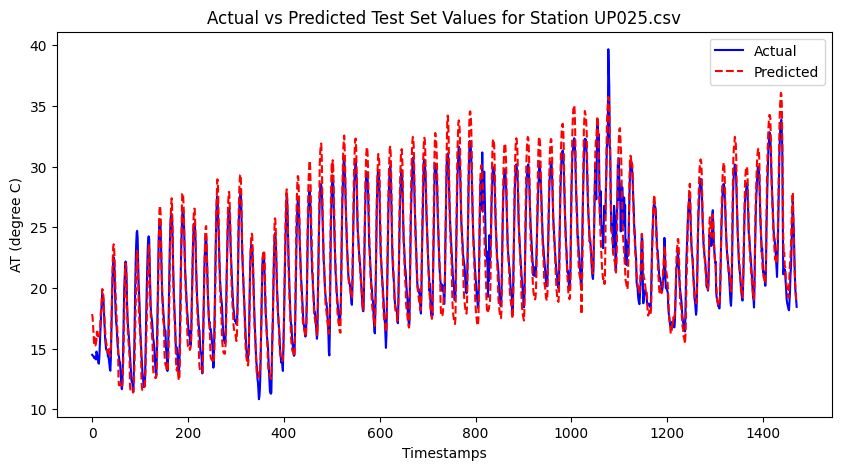

For Node 18:
UP026.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.3956
Mean Squared Error (MSE): 3.1738
Root Mean Squared Error (RMSE): 1.7815
Pearson Correlation Coefficient: 0.9662
R-squared (R²): 0.8852


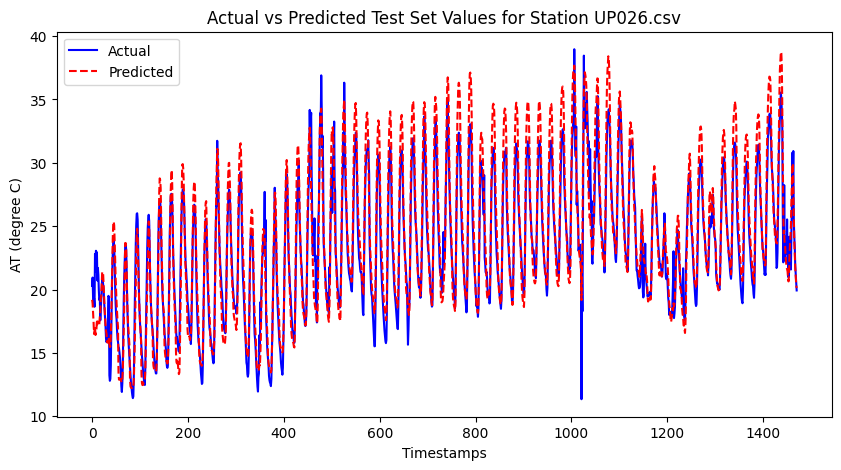

For Node 19:
UP028.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.9509
Mean Squared Error (MSE): 6.3464
Root Mean Squared Error (RMSE): 2.5192
Pearson Correlation Coefficient: 0.9600
R-squared (R²): 0.8912


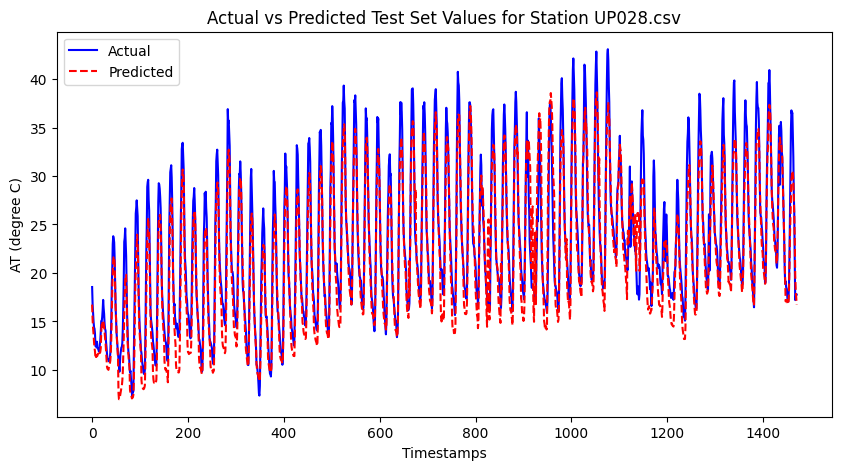

For Node 20:
UP029.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.2229
Mean Squared Error (MSE): 2.4796
Root Mean Squared Error (RMSE): 1.5747
Pearson Correlation Coefficient: 0.9840
R-squared (R²): 0.9332


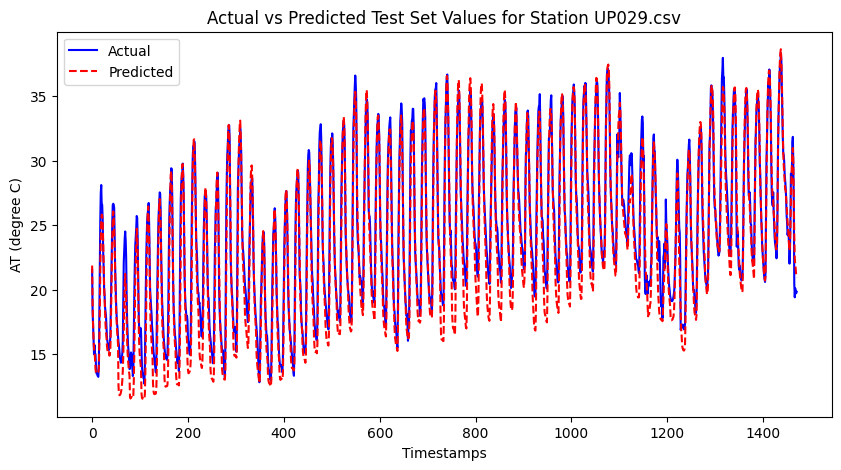

For Node 21:
UP030.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.9168
Mean Squared Error (MSE): 5.7780
Root Mean Squared Error (RMSE): 2.4037
Pearson Correlation Coefficient: 0.9585
R-squared (R²): 0.8687


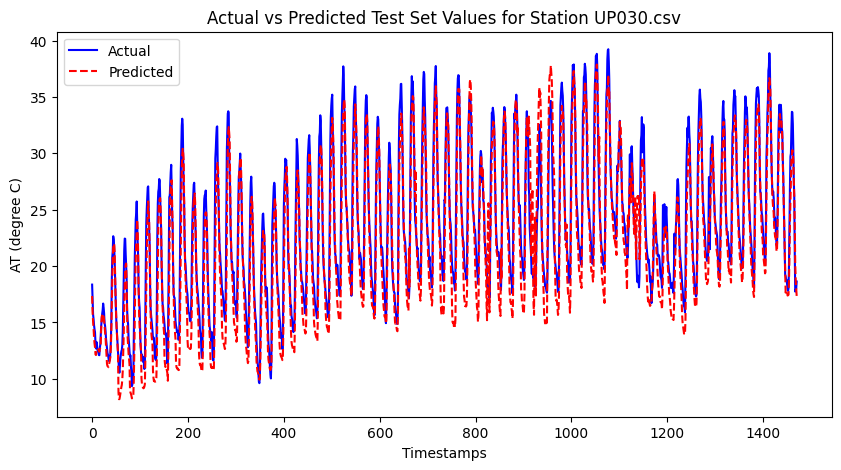

For Node 22:
UP031.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.8122
Mean Squared Error (MSE): 5.6429
Root Mean Squared Error (RMSE): 2.3755
Pearson Correlation Coefficient: 0.9518
R-squared (R²): 0.8844


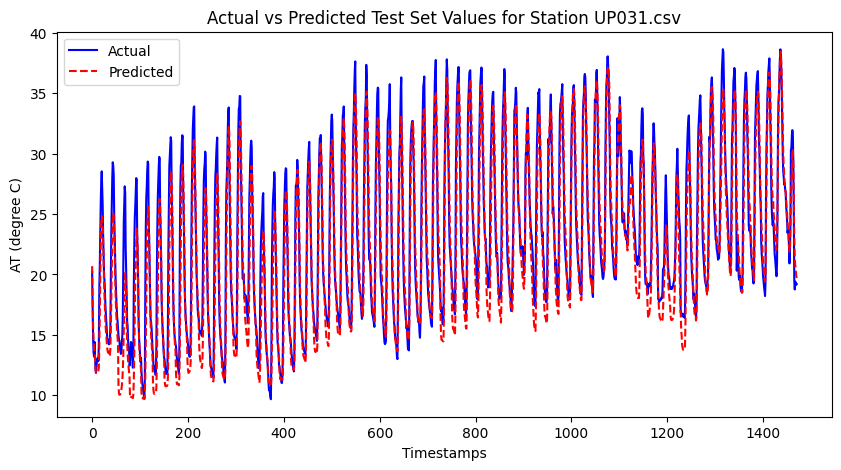

For Node 23:
UP032.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.3519
Mean Squared Error (MSE): 2.9406
Root Mean Squared Error (RMSE): 1.7148
Pearson Correlation Coefficient: 0.9651
R-squared (R²): 0.9144


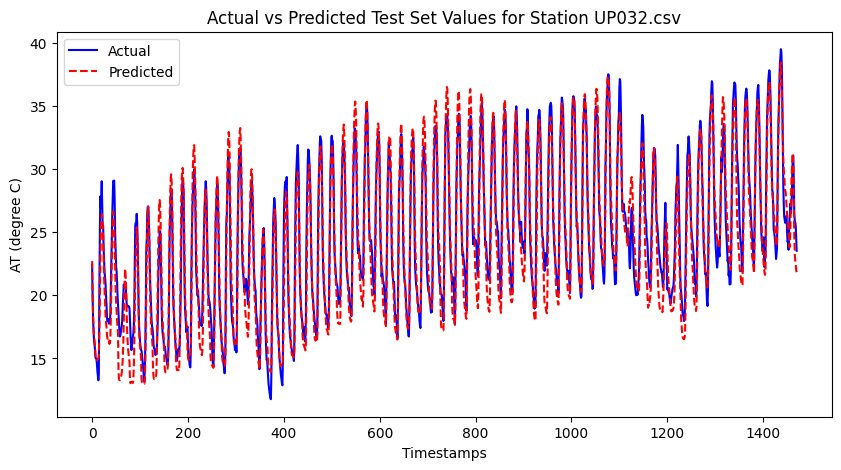

For Node 24:
UP033.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.2344
Mean Squared Error (MSE): 2.4302
Root Mean Squared Error (RMSE): 1.5589
Pearson Correlation Coefficient: 0.9829
R-squared (R²): 0.9334


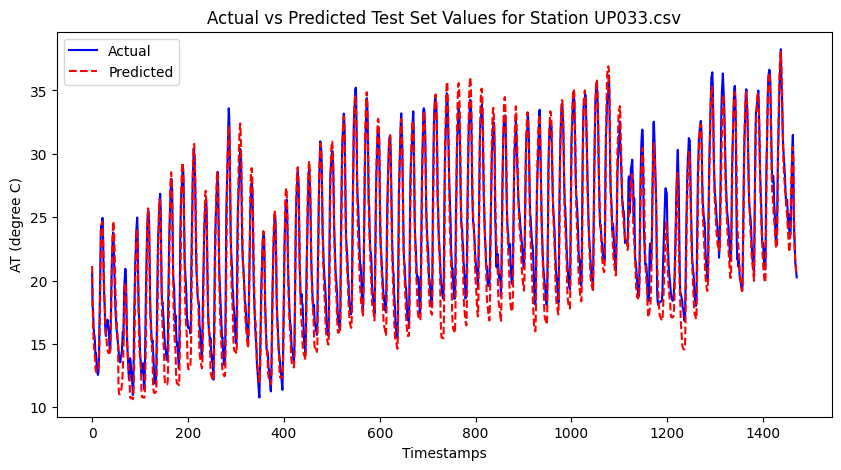

For Node 25:
UP034.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 3.6852
Mean Squared Error (MSE): 22.5203
Root Mean Squared Error (RMSE): 4.7456
Pearson Correlation Coefficient: 0.8774
R-squared (R²): 0.0010


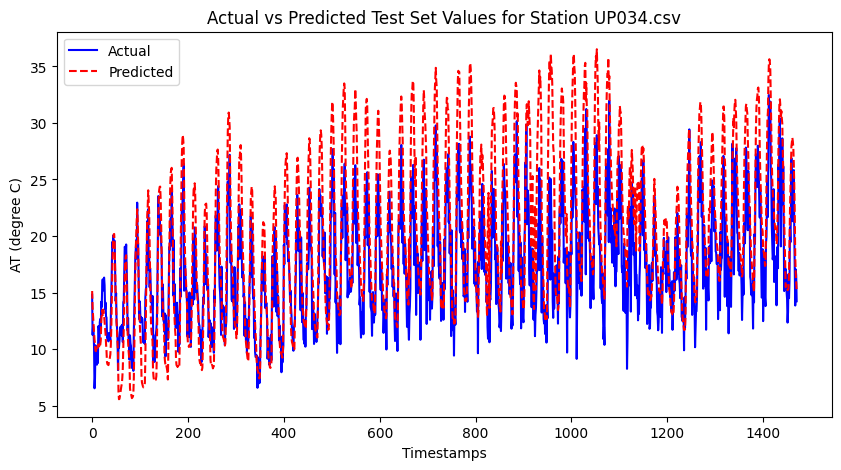

For Node 26:
UP035.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.4046
Mean Squared Error (MSE): 3.1390
Root Mean Squared Error (RMSE): 1.7717
Pearson Correlation Coefficient: 0.9751
R-squared (R²): 0.9193


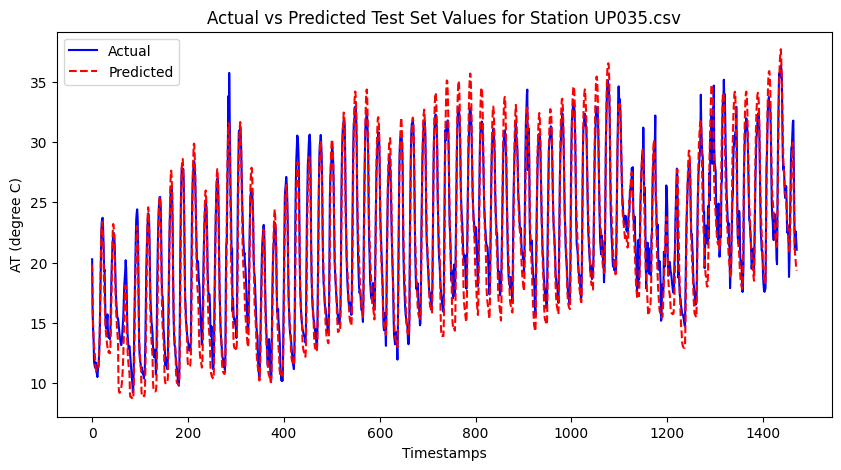

For Node 27:
UP036.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.4075
Mean Squared Error (MSE): 2.9838
Root Mean Squared Error (RMSE): 1.7274
Pearson Correlation Coefficient: 0.9779
R-squared (R²): 0.9127


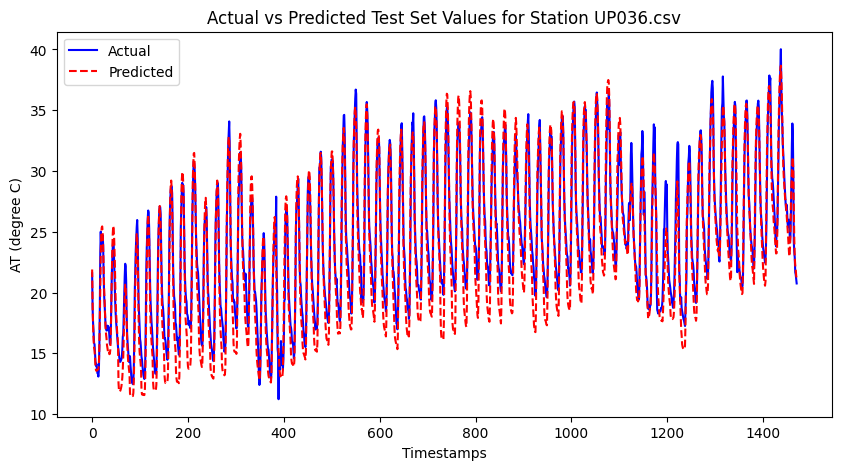

For Node 28:
UP037.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.6418
Mean Squared Error (MSE): 4.7887
Root Mean Squared Error (RMSE): 2.1883
Pearson Correlation Coefficient: 0.9577
R-squared (R²): 0.8791


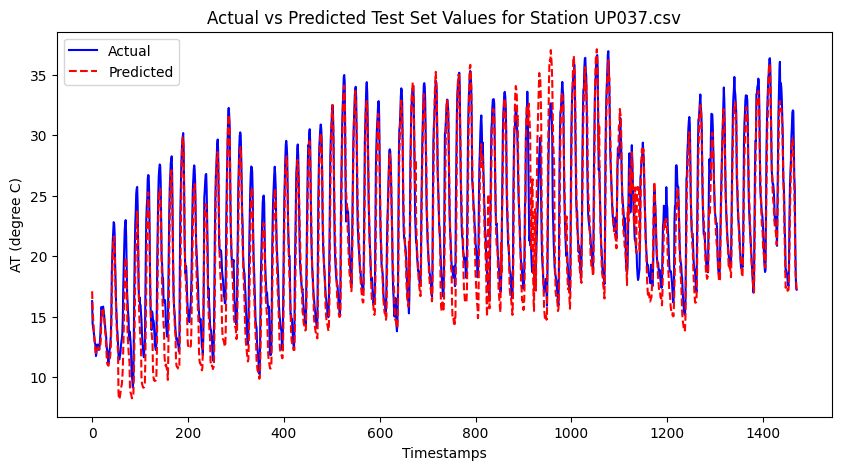

For Node 29:
UP038.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.4428
Mean Squared Error (MSE): 3.1205
Root Mean Squared Error (RMSE): 1.7665
Pearson Correlation Coefficient: 0.9805
R-squared (R²): 0.9048


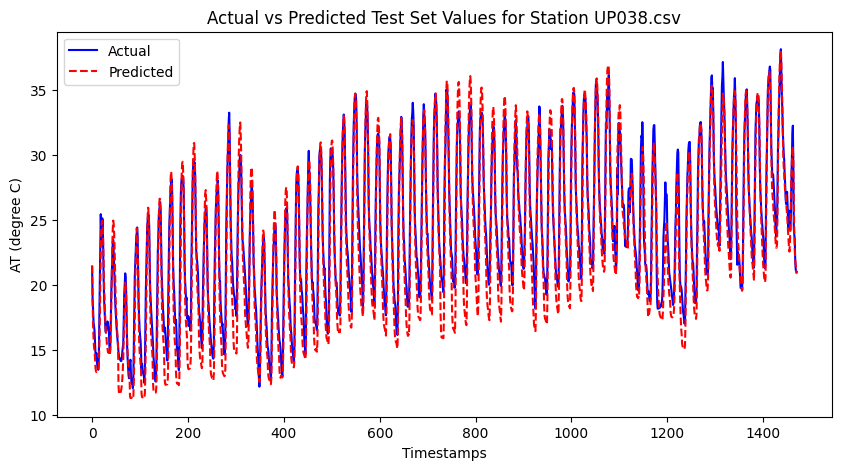

For Node 30:
UP039.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.7515
Mean Squared Error (MSE): 4.6460
Root Mean Squared Error (RMSE): 2.1555
Pearson Correlation Coefficient: 0.9679
R-squared (R²): 0.9104


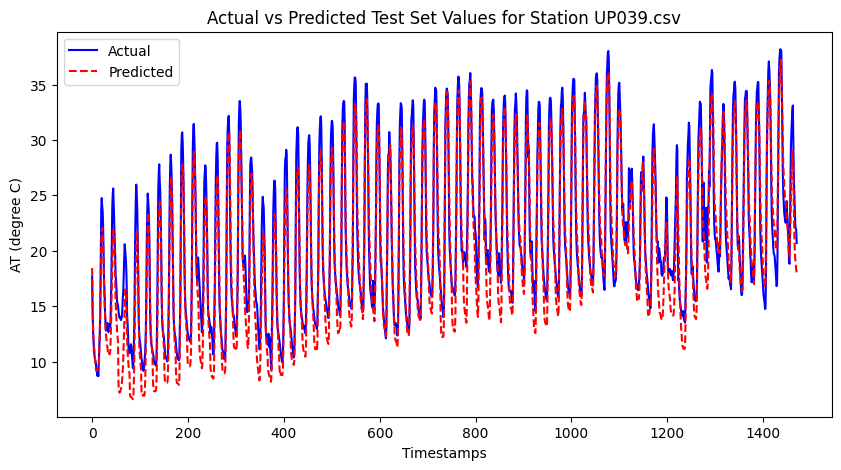

For Node 31:
UP040.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.6916
Mean Squared Error (MSE): 4.3657
Root Mean Squared Error (RMSE): 2.0894
Pearson Correlation Coefficient: 0.9678
R-squared (R²): 0.8972


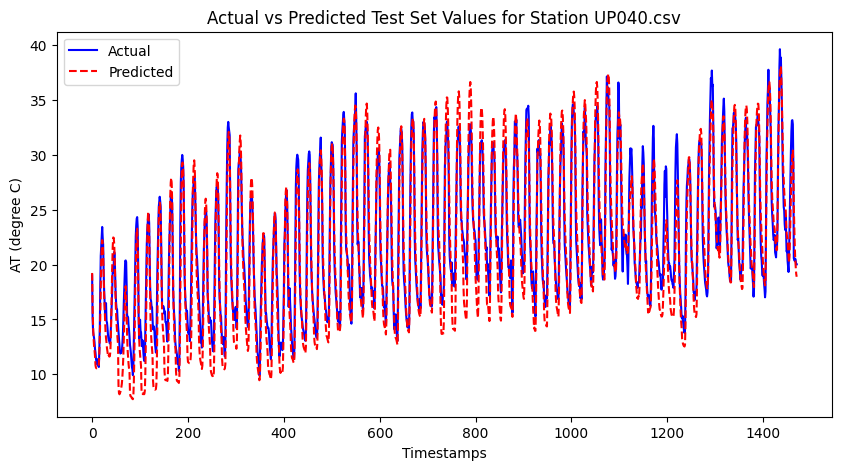

For Node 32:
UP041.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.6149
Mean Squared Error (MSE): 3.8295
Root Mean Squared Error (RMSE): 1.9569
Pearson Correlation Coefficient: 0.9669
R-squared (R²): 0.8871


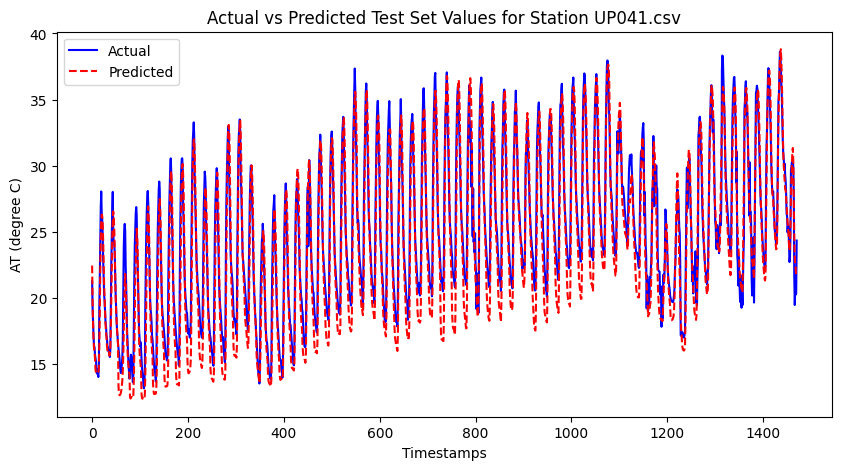

For Node 33:
UP042.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.4946
Mean Squared Error (MSE): 3.6530
Root Mean Squared Error (RMSE): 1.9113
Pearson Correlation Coefficient: 0.9640
R-squared (R²): 0.8919


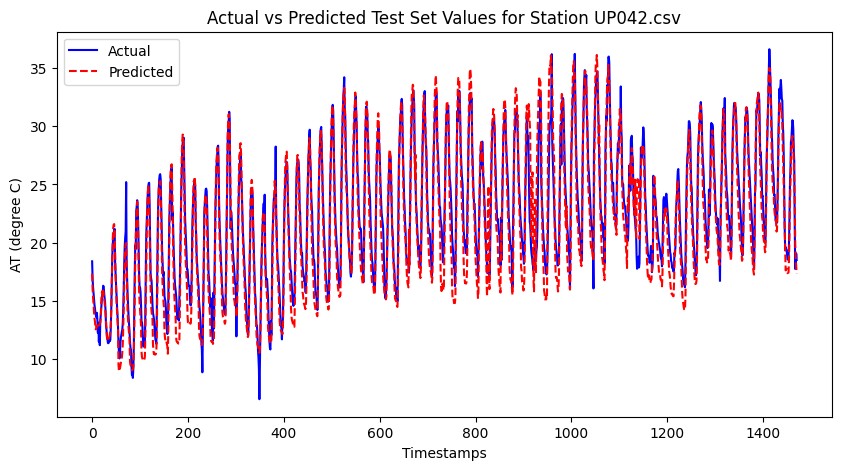

For Node 34:
UP043.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.3361
Mean Squared Error (MSE): 3.3283
Root Mean Squared Error (RMSE): 1.8244
Pearson Correlation Coefficient: 0.9651
R-squared (R²): 0.9091


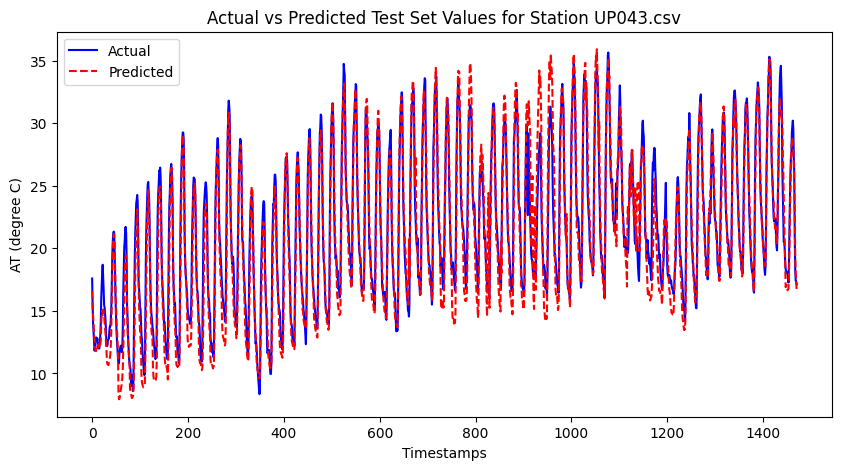

For Node 35:
UP044.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.5439
Mean Squared Error (MSE): 3.7897
Root Mean Squared Error (RMSE): 1.9467
Pearson Correlation Coefficient: 0.9810
R-squared (R²): 0.9140


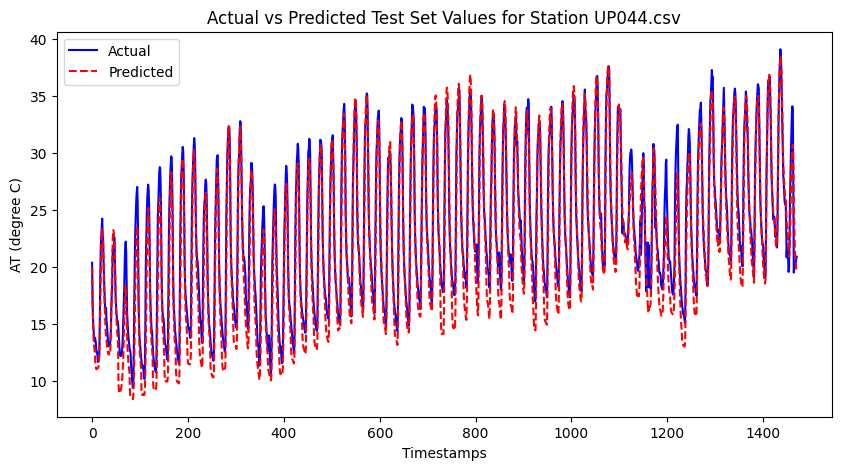

For Node 36:
UP046.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.1846
Mean Squared Error (MSE): 2.3281
Root Mean Squared Error (RMSE): 1.5258
Pearson Correlation Coefficient: 0.9709
R-squared (R²): 0.9343


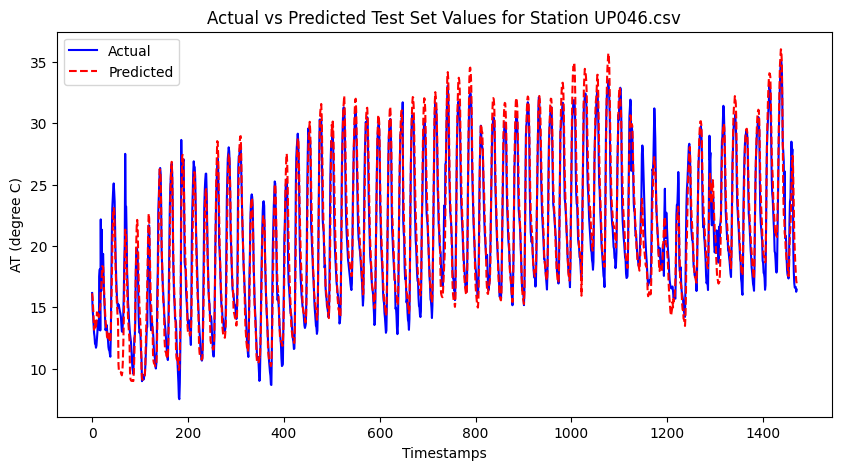

For Node 37:
UP048.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.3963
Mean Squared Error (MSE): 3.1455
Root Mean Squared Error (RMSE): 1.7736
Pearson Correlation Coefficient: 0.9584
R-squared (R²): 0.9148


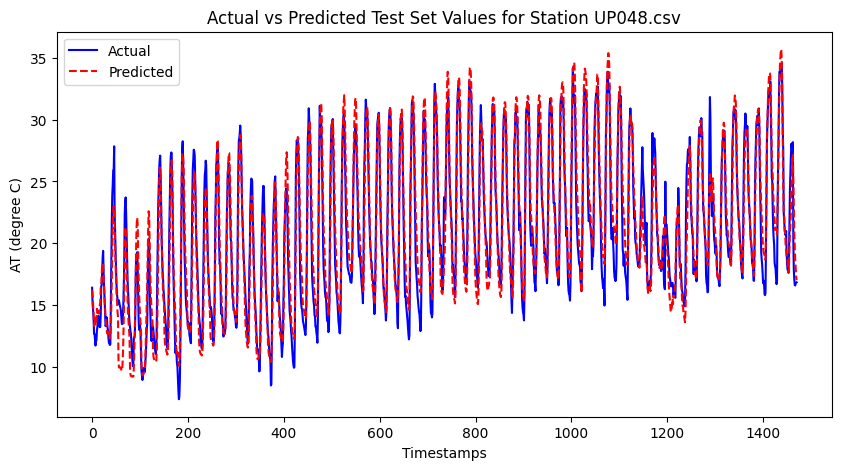

For Node 38:
UP049.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.4476
Mean Squared Error (MSE): 3.1467
Root Mean Squared Error (RMSE): 1.7739
Pearson Correlation Coefficient: 0.9633
R-squared (R²): 0.9043


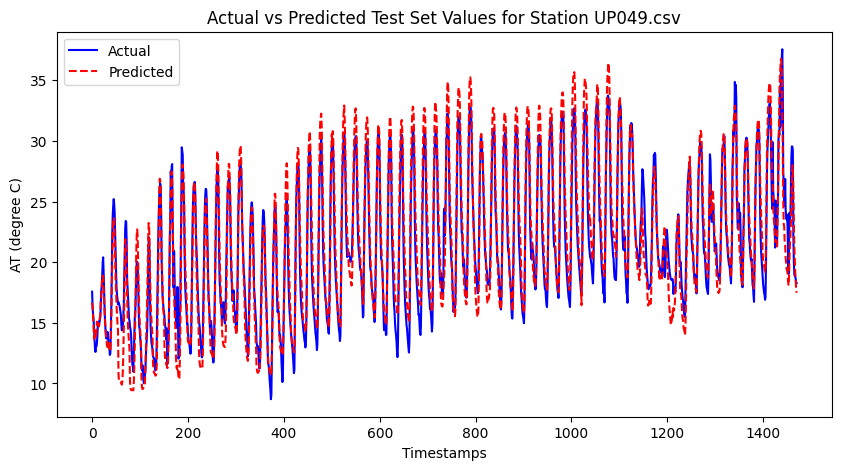

For Node 39:
UP050.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.2468
Mean Squared Error (MSE): 2.9920
Root Mean Squared Error (RMSE): 1.7297
Pearson Correlation Coefficient: 0.9462
R-squared (R²): 0.8816


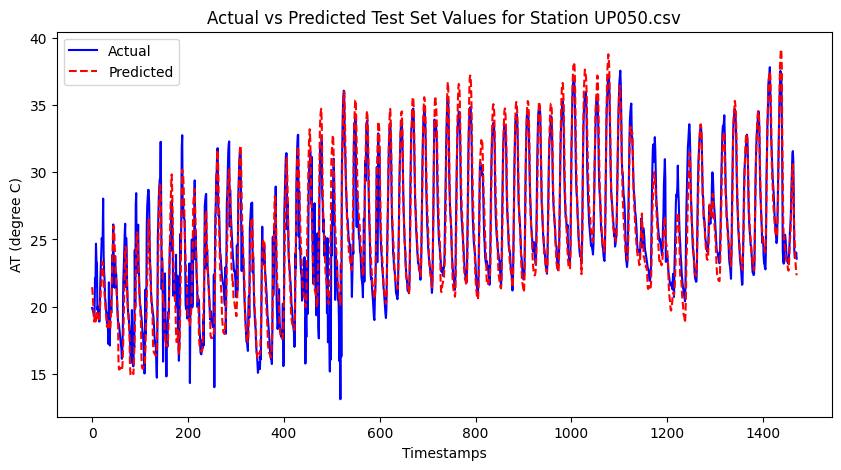

For Node 40:
UP051.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 3.5533
Mean Squared Error (MSE): 41.2504
Root Mean Squared Error (RMSE): 6.4226
Pearson Correlation Coefficient: 0.6792
R-squared (R²): 0.3944


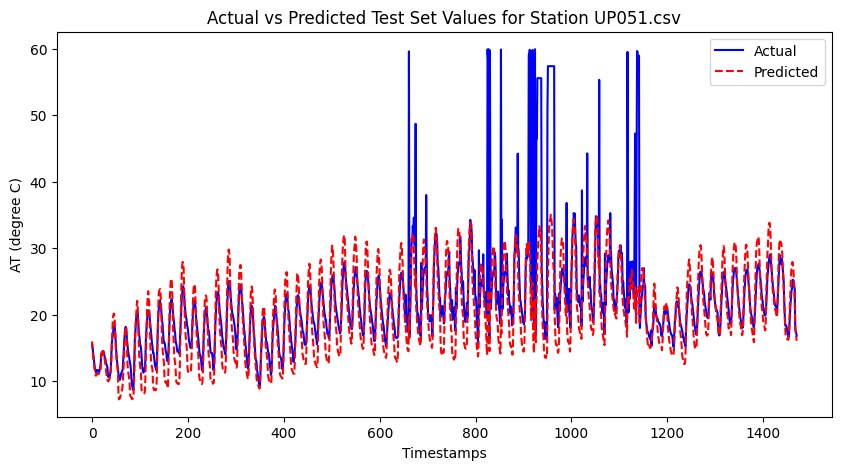

For Node 41:
UP052.csv Performance Metrics (Test Set):
Mean Absolute Error (MAE): 1.9820
Mean Squared Error (MSE): 5.9353
Root Mean Squared Error (RMSE): 2.4362
Pearson Correlation Coefficient: 0.9575
R-squared (R²): 0.8369


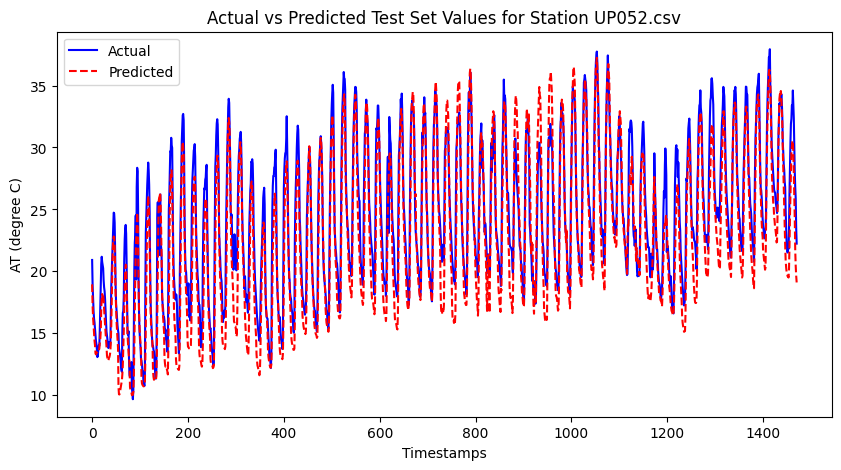

Train Temporal GNN Imputed.csv
CSV file 'Train Temporal GNN Imputed.csv' created successfully.
Test Temporal GNN Imputed.csv
CSV file 'Test Temporal GNN Imputed.csv' created successfully.


In [16]:
import torch
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import GATConv
from torch.optim.lr_scheduler import StepLR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import pearsonr
import numpy as np

# Prepare temporal sequences with GAT for each timestamp and station

def prepare_temporal_sequences(dataframes, adjacency_matrix, sequence_length=3):
    num_stations = len(dataframes)
    num_timestamps = len(dataframes[0]) - sequence_length + 1
    temporal_sequences = []
    
    for start in range(num_timestamps):
        sequence = []
        for i in range(sequence_length):
            timestamp_index = start + i
            features = np.stack([df.iloc[timestamp_index].values for df in dataframes], axis=0)
            node_features = torch.tensor(features, dtype=torch.float)
            edge_index = torch.tensor(np.array(np.nonzero(adjacency_matrix)), dtype=torch.long)
            target_values = torch.tensor([df.iloc[timestamp_index]['AT (degree C)'] for df in dataframes], dtype=torch.float)
            graph_data = Data(x=node_features, edge_index=edge_index, y=target_values)
            sequence.append(graph_data)
        temporal_sequences.append(sequence)
        print(f'Temporal sequence {start + 1} created.')
    
    return temporal_sequences

train_sequences = prepare_temporal_sequences(train_dataframes, adjacency_matrix)
test_sequences = prepare_temporal_sequences(test_dataframes, adjacency_matrix)

# Define TGNN model
class TGNNModel(torch.nn.Module):
    def __init__(self, in_channels, gat_hidden_channels, lstm_hidden_channels, out_channels, sequence_length):
        super(TGNNModel, self).__init__()
        self.gat1 = GATConv(in_channels, gat_hidden_channels, heads=8, dropout=0.2)
        self.gat2 = GATConv(gat_hidden_channels * 8, gat_hidden_channels, heads=1, concat=False, dropout=0.2)
        self.lstm = torch.nn.LSTM(gat_hidden_channels, lstm_hidden_channels, batch_first=True)
        self.linear = torch.nn.Linear(lstm_hidden_channels, out_channels)
        self.sequence_length = sequence_length
        
    def forward(self, sequences):
        gat_outputs = []
        for graph_data in sequences:
            x, edge_index = graph_data.x, graph_data.edge_index
            x = F.elu(self.gat1(x, edge_index))
            x = F.dropout(x, p=0.2, training=self.training)
            x = self.gat2(x, edge_index)
            gat_outputs.append(x)
        
        gat_outputs = torch.stack(gat_outputs, dim=1)  # Shape: (num_stations, sequence_length, gat_hidden_channels)
        lstm_out, _ = self.lstm(gat_outputs)  # Shape: (num_stations, sequence_length, lstm_hidden_channels)
        lstm_out = lstm_out[:, -1, :]  # Take the last output of the sequence
        return self.linear(lstm_out)

# Initialize model, optimizer, and scheduler
in_channels = train_sequences[0][0].x.size(-1)
out_channels = 1
gat_hidden_channels = 8
lstm_hidden_channels = 16
sequence_length = 3

model = TGNNModel(in_channels, gat_hidden_channels, lstm_hidden_channels, out_channels, sequence_length)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005, weight_decay=5e-4)
scheduler = StepLR(optimizer, step_size=5, gamma=0.5)
loss_fn = torch.nn.MSELoss()

# Training function for TGNN model
def train_tgnn(train_sequences, epochs=30):
    model.train()
    for epoch in range(epochs):
        epoch_loss = 0
        for sequence in train_sequences:
            optimizer.zero_grad()
            out = model(sequence)
            loss = loss_fn(out.squeeze(), sequence[-1].y)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        scheduler.step()
        print(f"Epoch {epoch + 1}, Loss: {epoch_loss / len(train_sequences)}")

# Train TGNN model
train_tgnn(train_sequences)

# Evaluate TGNN model and calculate metrics across 41 stations
def evaluate_tgnn(sequences):
    model.eval()
    all_predictions = []
    all_actuals = []
    with torch.no_grad():
        for sequence in sequences:
            prediction = model(sequence)
            all_predictions.append(prediction.squeeze().numpy())
            all_actuals.append(sequence[-1].y.numpy())
    all_predictions = np.array(all_predictions)
    all_actuals = np.array(all_actuals)
    return all_predictions, all_actuals

train_predictions, train_actuals = evaluate_tgnn(train_sequences)
test_predictions, test_actuals = evaluate_tgnn(test_sequences)

# Inverse transform the target column for actuals and predictions
def inverse_transform(predictions, actuals, scalers):
    inv_predictions = []
    inv_actuals = []
    for station_idx in range(predictions.shape[1]):
        scaler = scalers[input_files[station_idx]]
        inv_predictions.append(scaler.inverse_transform(predictions[:, station_idx].reshape(-1, 1)).flatten())
        inv_actuals.append(scaler.inverse_transform(actuals[:, station_idx].reshape(-1, 1)).flatten())
    inv_predictions = np.array(inv_predictions).T
    inv_actuals = np.array(inv_actuals).T
    return inv_predictions, inv_actuals

# Inverse transform for train and test sets
train_predictions_inv, train_actuals_inv = inverse_transform(train_predictions, train_actuals, scalers)
test_predictions_inv, test_actuals_inv = inverse_transform(test_predictions, test_actuals, scalers)

# Calculate metrics for 41 stations on inverse-transformed values
def calculate_metrics(predictions, actuals):
    mae = mean_absolute_error(actuals, predictions, multioutput='raw_values')
    mse = mean_squared_error(actuals, predictions, multioutput='raw_values')
    rmse = np.sqrt(mse)
    r2 = r2_score(actuals, predictions, multioutput='raw_values')
    corr = [pearsonr(predictions[:, i], actuals[:, i])[0] for i in range(predictions.shape[1])]
    return mae, mse, rmse, r2, corr

train_mae, train_mse, train_rmse, train_r2, train_corr = calculate_metrics(train_predictions_inv, train_actuals_inv)
test_mae, test_mse, test_rmse, test_r2, test_corr = calculate_metrics(test_predictions_inv, test_actuals_inv)

# Print metrics and plot actual vs predicted graphs for each station
num_stations = test_predictions_inv.shape[1]

for station in range(num_stations):
    print(f"For Node {station + 1}:")
    print(f"{input_files[station]} Performance Metrics (Train Set):")
    print(f"Mean Absolute Error (MAE): {train_mae[station]:.4f}")
    print(f"Mean Squared Error (MSE): {train_mse[station]:.4f}")
    print(f"Root Mean Squared Error (RMSE): {train_rmse[station]:.4f}")
    print(f"Pearson Correlation Coefficient: {train_corr[station]:.4f}")
    print(f"R-squared (R²): {train_r2[station]:.4f}")

    # Plot actual vs predicted values (inverse-transformed)
    plt.figure(figsize=(10, 6))
    plt.plot(train_actuals_inv[:, station], label="Actual", color="b")
    plt.plot(train_predictions_inv[:, station], label="Predicted", color="r", linestyle='dashed')
    plt.title(f"Actual vs Predicted Train Set Values for Station {input_files[station]}")
    plt.xlabel("Timestamps")
    plt.ylabel("AT (degree C)")
    plt.legend()
    plt.show()


for station in range(num_stations):
    print(f"For Node {station + 1}:")
    print(f"{input_files[station]} Performance Metrics (Test Set):")
    print(f"Mean Absolute Error (MAE): {test_mae[station]:.4f}")
    print(f"Mean Squared Error (MSE): {test_mse[station]:.4f}")
    print(f"Root Mean Squared Error (RMSE): {test_rmse[station]:.4f}")
    print(f"Pearson Correlation Coefficient: {test_corr[station]:.4f}")
    print(f"R-squared (R²): {test_r2[station]:.4f}")

    # Plot actual vs predicted values (inverse-transformed)
    plt.figure(figsize=(10, 5))
    plt.plot(test_actuals_inv[:, station], label="Actual", color="b")
    plt.plot(test_predictions_inv[:, station], label="Predicted", color="r", linestyle='dashed')
    plt.title(f"Actual vs Predicted Test Set Values for Station {input_files[station]}")
    plt.xlabel("Timestamps")
    plt.ylabel("AT (degree C)")
    plt.legend()
    plt.show()


def create_metrics_gnn_csv(file_name, input_files, mae_list, mse_list, rmse_list, r2_list, corr_list):
    metrics_df = pd.DataFrame({
        "File Name": input_files,
        "MAE": mae_list,
        "MSE": mse_list,
        "RMSE": rmse_list,
        "R2": r2_list,
        "CorrCoeff": corr_list
    })
    metrics_df.to_csv(file_name, index=False)
    print(f"CSV file '{file_name}' created successfully.")


# Create CSV for training set
file_name = "Train Temporal GNN Imputed.csv"
print(file_name)
create_metrics_gnn_csv(file_name, input_files, train_mae, train_mse, train_rmse, train_r2, train_corr)

# Create CSV for training set
file_name = "Test Temporal GNN Imputed.csv"
print(file_name)
create_metrics_gnn_csv(file_name, input_files, test_mae, test_mse, test_rmse, test_r2, test_corr)
